In [33]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
!ls /content/gdrive/MyDrive/Health/ALL_data/Final_data.csv

/content/gdrive/MyDrive/Health/ALL_data/Final_data.csv


In [4]:
import pandas as pd
df = pd.read_csv("/content/gdrive/MyDrive/Health/ALL_data/Final_data.csv")
df.head()

,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
0,0,1st week,Meghalaya,East Jaintia Hills,Acute Diarrhoeal Disease,160,NaN,2,1,2022,25.251576,92.484050,0.020354,34.5,291.533333
1,1,2nd week,Maharashtra,Gadchiroli,Malaria,7,2.0,10,1,2022,19.759070,80.162281,0.007479,9.0,299.970000
2,2,3rd week,Tamil Nadu,Pudukottai,Acute Diarrhoeal Disease,8,NaN,18,1,2022,10.382651,78.819126,0.107413,12.0,300.766667
3,3,3rd week,Gujarat,Patan,Acute Diarrhoeal Disease,7,NaN,11,1,2022,23.774057,71.683735,0.065094,9.0,299.080000
4,4,3rd week,Kerala,Ernakulam,Acute Diarrhoeal Disease,14,NaN,24,12,2021,9.984080,76.274146,0.041256,33.0,303.028000


In [5]:
df.Disease.unique()

array(['Acute Diarrhoeal Disease', 'Malaria',
       'Acute Encephalitis Syndrome', 'Acute Gastroenteritis', 'Dengue',
       'pyrexia of unknown origin', 'Chikungunya', 'Cholera',
       'Malaria (PV)', 'Dengue Fever', 'Suspected Dengue',
       'Dengue Chikungunya', 'Dengue And Chikungunya',
       'Suspected Cholera', 'Diarrhea', 'Suspected Chikungunya',
       'Suspected Dengue And Chikungunya', 'Gastroenteritis',
       'Dengue And Malaria', 'Dengue/Chikungunya', 'Chikungunya/Dengue',
       'Chikungunya/ Dengue'], dtype=object)

In [6]:
df.week_of_outbreak.unique()

array(['1st week', '2nd week', '3rd week', '5th week', '6th week',
       '7th week', '8th week', '9th week', '10th week', '11th week',
       '12th week', '13th week', '14th week', '15th week', '16th week',
       '17th week', '18th week', '19th week', '20th week', '21st week',
       '22nd week', '23rd week', '24th week', '4th week', '25th week',
       '26th week', '27th week', '28th week', '29th week', '30th week',
       '31st week', '32nd week', '33rd week', '34th week', '35th week',
       '36th week', '37th week', '38th week', '39th week', '40th week',
       '41st week', '42nd week', '43rd week', '44th week', '45th week',
       '46th week', '47th week', '48th week', '49th week', '50th week',
       '51st week', '52nd week', '53rd week'], dtype=object)

In [7]:
df.year.unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012,
       2011, 2010, 2009])

In [35]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you've found the correct path
shapefile_path = '/content/gdrive/MyDrive/india_shapefiles/India_State_Boundary.shp'
india_states = gpd.read_file(shapefile_path)

# Assuming 'df_add' contains 'Longitude', 'Latitude', and 'Cases'
data = df_add  # Make sure df_add is loaded appropriately

# Convert DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.Longitude, data.Latitude))
gdf.crs = "EPSG:4326"  # Ensure this is the correct CRS

# Match the CRS of the shapefile to the GeoDataFrame
india_states = india_states.to_crs(gdf.crs)


# Acute Diarrhoeal Disease

In [8]:
df_add = df[df.Disease == "Acute Diarrhoeal Disease"][df.year==2022]
df_add.head()

<ipython-input-8-71bc616d30ff>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_add = df[df.Disease == "Acute Diarrhoeal Disease"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
0,0,1st week,Meghalaya,East Jaintia Hills,Acute Diarrhoeal Disease,160,NaN,2,1,2022,25.251576,92.484050,0.020354,34.5,291.533333
2,2,3rd week,Tamil Nadu,Pudukottai,Acute Diarrhoeal Disease,8,NaN,18,1,2022,10.382651,78.819126,0.107413,12.0,300.766667
3,3,3rd week,Gujarat,Patan,Acute Diarrhoeal Disease,7,NaN,11,1,2022,23.774057,71.683735,0.065094,9.0,299.080000
5,5,3rd week,Tamil Nadu,Pudukottai,Acute Diarrhoeal Disease,8,NaN,18,1,2022,10.382651,78.819126,0.107413,12.0,300.766667
8,8,6th week,Odisha,Koraput,Acute Diarrhoeal Disease,15,NaN,11,2,2022,18.723202,82.608118,0.000491,12.0,300.556667


In [ ]:
df_add.shape

(141, 15)

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

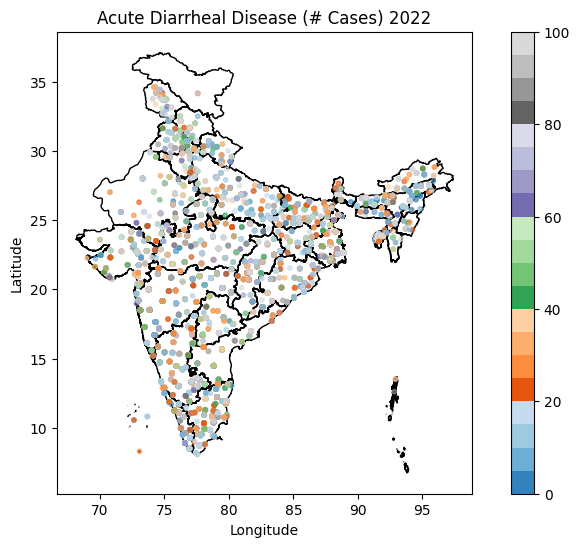

In [39]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

'''# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)

plt.title('Acute Diarrheal Disease (# Cases) 2022')  # I think this is graph of overall cases in India
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

'''
# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the state boundaries first
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

# Plotting the points for the cases, colored by the number of cases
gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)

plt.title('Acute Diarrheal Disease (# Cases) 2022')  # I think this is graph of overall cases in India
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

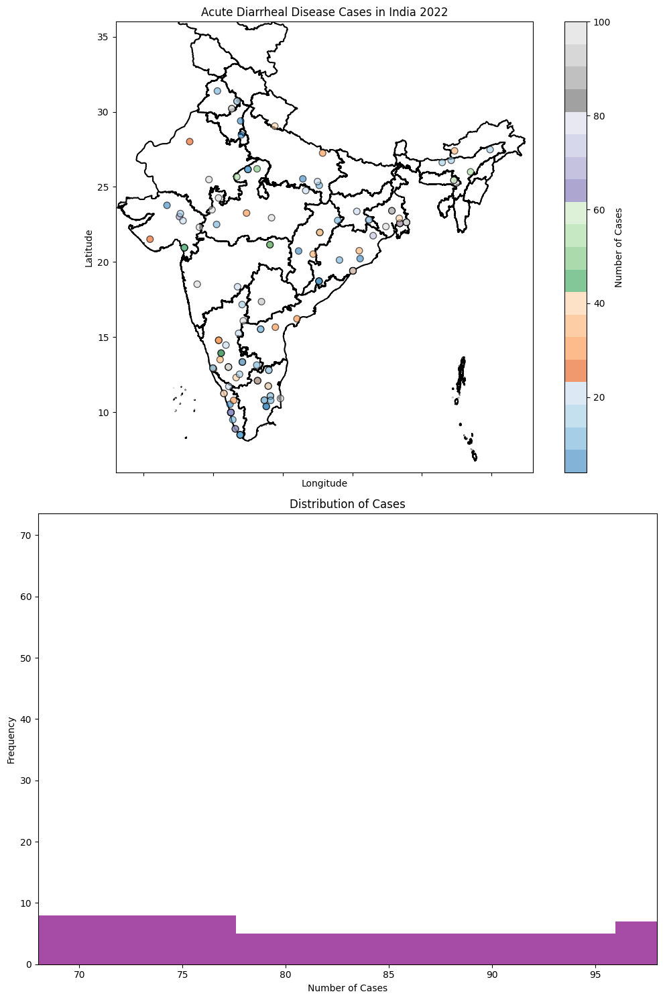

In [36]:

# Assuming 'df_add' is already loaded and contains your 'Longitude', 'Latitude', and 'Cases'
data = df_add  # Make sure this DataFrame is properly defined

# Create a figure with two subplots (one above the other)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 15), sharex=True)

# Plot 1: State boundaries and data points
india_states.plot(ax=ax1, color='none', edgecolor='black', linewidth=1.5)
scatter = ax1.scatter(gdf.geometry.x, gdf.geometry.y, c=gdf['Cases'], cmap='tab20c', alpha=0.6, edgecolor='k', s=50,vmax =100)
cbar = plt.colorbar(scatter, ax=ax1, orientation='vertical')
cbar.set_label('Number of Cases')
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Acute Diarrheal Disease Cases in India 2022')

# Set the limits for better visualization
ax1.set_xlim(68, 98)
ax1.set_ylim(6, 36)

# Plot 2: Histogram of the cases
ax2.hist(gdf['Cases'], bins=30, color='purple', alpha=0.7)
ax2.set_title('Distribution of Cases')
ax2.set_xlabel('Number of Cases')
ax2.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-42-2a65203fdf3b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_add['Cases'] = pd.to_numeric(df_add['Cases'], errors='coerce').fillna(0)


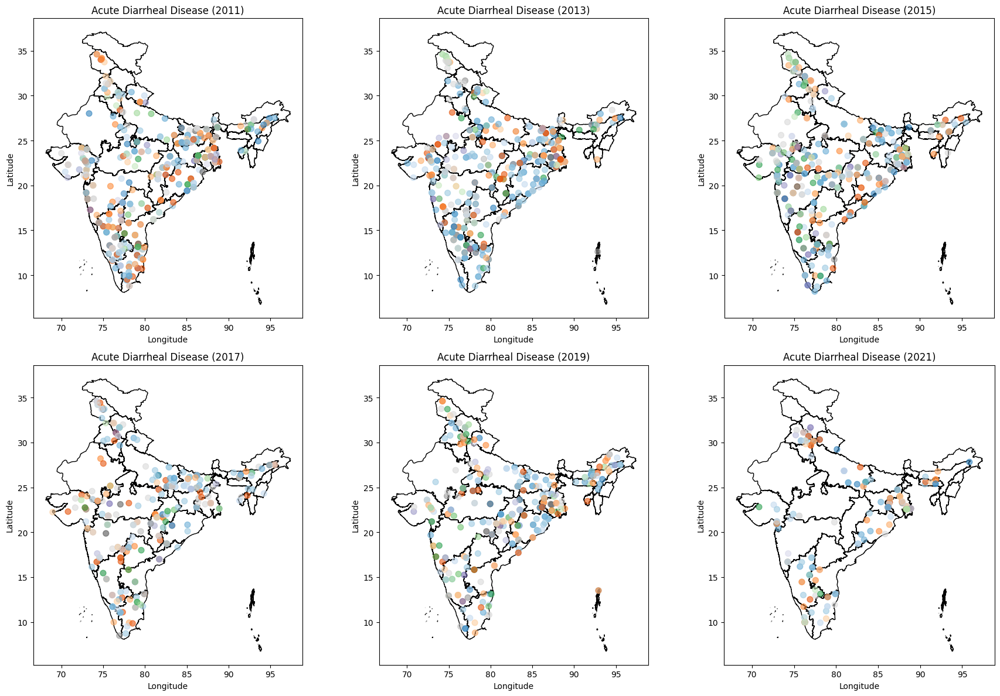

In [42]:
# First, filter the dataset for Acute Diarrhoeal Disease and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_add = df[(df['Disease'] == "Acute Diarrhoeal Disease") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_add['Cases'] = pd.to_numeric(df_add['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_add[df_add['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )

    # Plotting the points for the cases, colored by the number of cases
    ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot

    # Plotting state boundaries on each subplot
    india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

    gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)

    # Setting titles and labels for each subplot
    ax.set_title(f'Acute Diarrheal Disease ({year})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-43-53b7da03bb46>:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


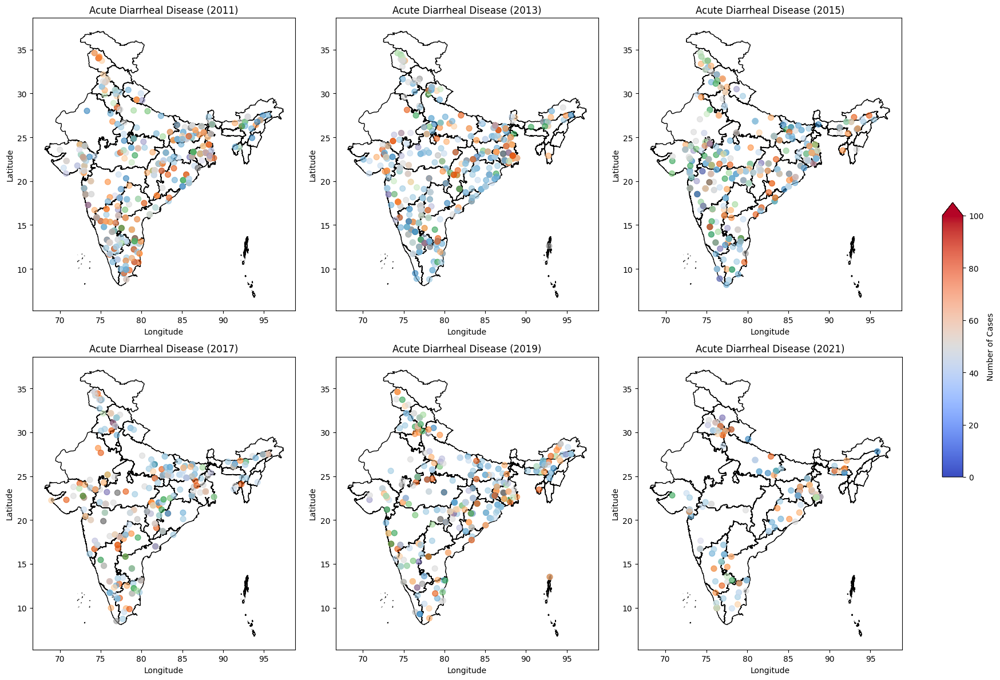

In [43]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_add[df_add['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot

        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Diarrheal Disease ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Acute Diarrheal Disease ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Malaria

In [44]:
df_mal = df[df.Disease == "Malaria"][df.year==2022]
df_add.head()

<ipython-input-44-cef0748c3211>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_mal = df[df.Disease == "Malaria"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
4,4,3rd week,Kerala,Ernakulam,Acute Diarrhoeal Disease,14.0,NaN,24,12,2021,9.984080,76.274146,0.041256,33.0,303.028000
187,187,1st week,Kerala,Ernakulam,Acute Diarrhoeal Disease,92.0,NaN,1,1,2021,9.984080,76.274146,0.183785,34.0,302.304000
190,190,3rd week,Karnataka,Raichur,Acute Diarrhoeal Disease,13.0,NaN,20,1,2021,16.083333,77.166667,0.000023,8.0,304.403333
191,191,3rd week,Karnataka,Chikkaballapur,Acute Diarrhoeal Disease,61.0,NaN,24,1,2021,13.610224,77.512772,0.000920,NaN,303.090000
193,193,3rd week,Karnataka,Ballari,Acute Diarrhoeal Disease,47.0,1.0,20,1,2021,15.248541,76.832365,0.000023,8.0,303.213333


In [45]:
df_mal.shape

(8, 15)

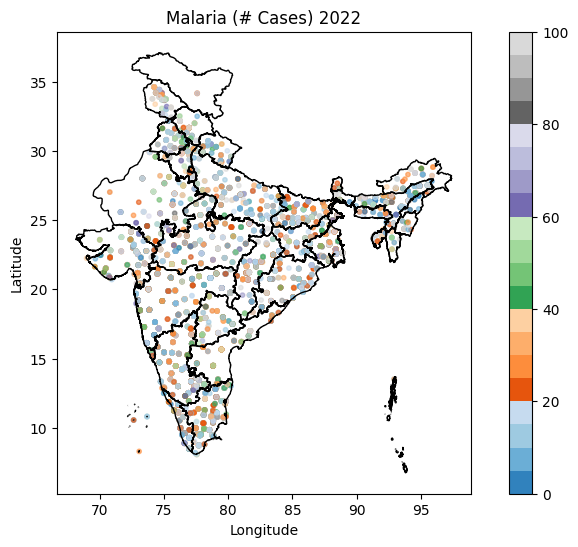

In [46]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
# Plotting state boundaries on each subplot
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Malaria (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-47-a48a7e305742>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mal['Cases'] = pd.to_numeric(df_mal['Cases'], errors='coerce').fillna(0)


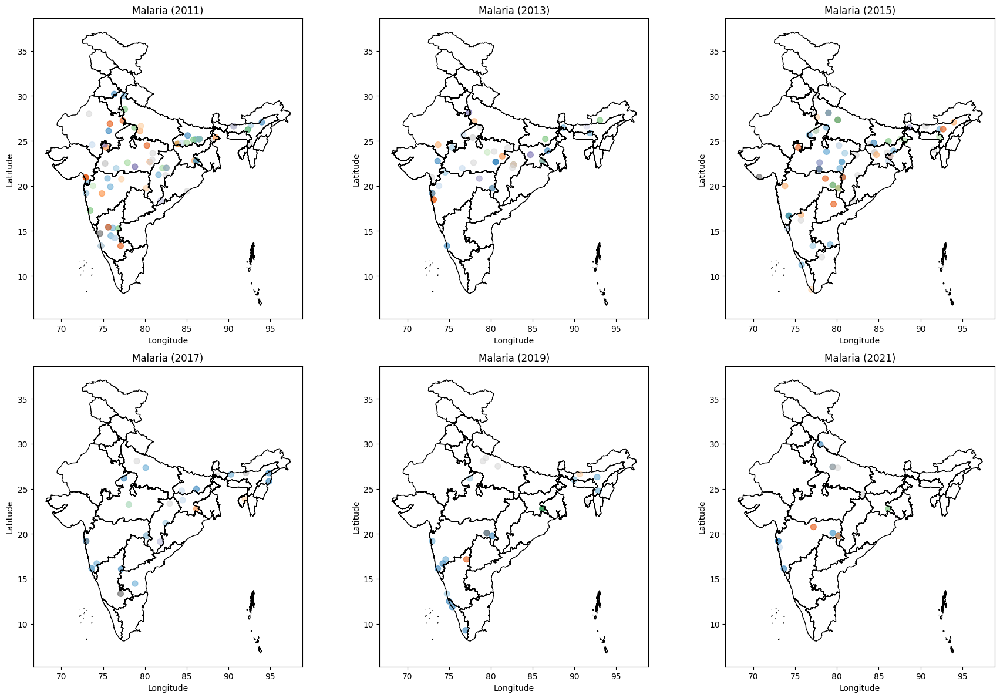

In [47]:
# First, filter the dataset for Acute Diarrhoeal Disease and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_mal = df[(df['Disease'] == "Malaria") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_mal['Cases'] = pd.to_numeric(df_mal['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_mal[df_mal['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )

    # Plotting the points for the cases, colored by the number of cases
    ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
    gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
    # Plotting state boundaries on each subplot
    india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

    # Setting titles and labels for each subplot
    ax.set_title(f'Malaria ({year})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-48-5c43052940b0>:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


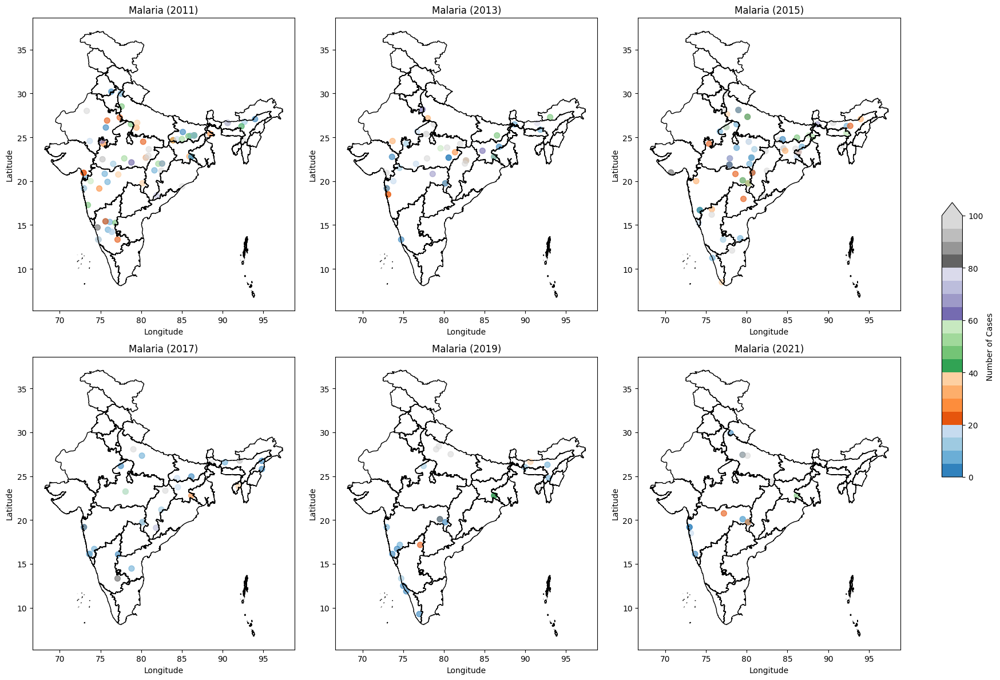

In [48]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_mal[df_mal['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Acute Encephalitis Syndrome

In [49]:
df_aes = df[df.Disease == "Acute Encephalitis Syndrome"][df.year==2022]
df_aes.head()

<ipython-input-49-a1770fc8aae8>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_aes = df[df.Disease == "Acute Encephalitis Syndrome"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
6,6,5th week,Uttar Pradesh,Fatehpur,Acute Encephalitis Syndrome,1.0,NaN,24,1,2022,25.843539,80.918004,0.09903,NaN,290.18


In [50]:
df_aes.shape

(1, 15)

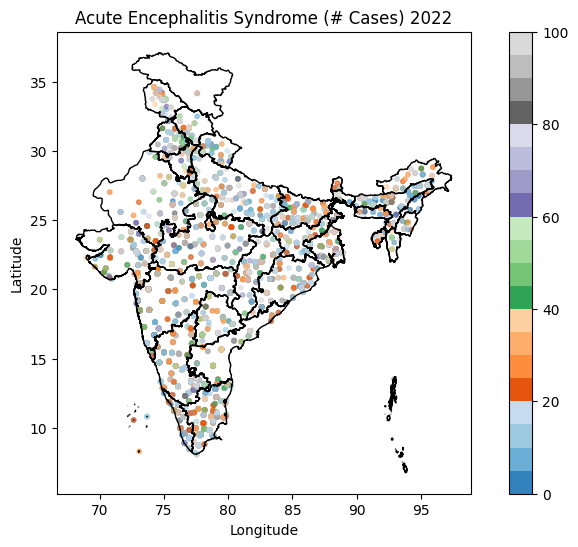

In [51]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
# Plotting state boundaries on each subplot
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Acute Encephalitis Syndrome (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-52-9a750945b455>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aes['Cases'] = pd.to_numeric(df_aes['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.


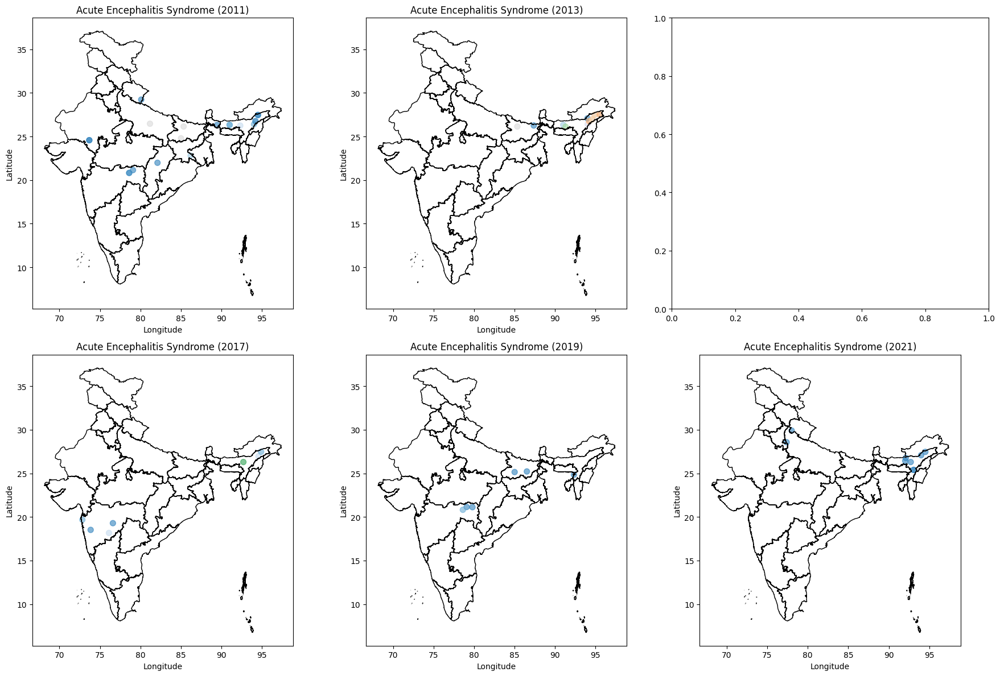

In [52]:
# First, filter the dataset for Acute Diarrhoeal Disease and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_aes = df[(df['Disease'] == "Acute Encephalitis Syndrome") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_aes['Cases'] = pd.to_numeric(df_aes['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_aes[df_aes['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Encephalitis Syndrome ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-53-9200d4a7ebdd>:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


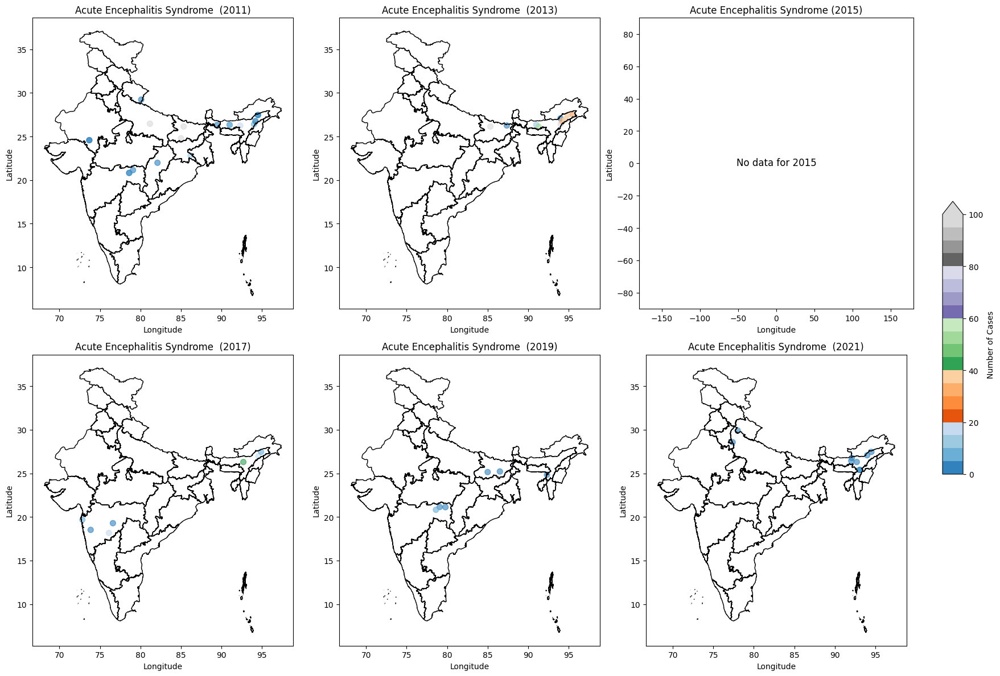

In [53]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_aes[df_aes['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Encephalitis Syndrome  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Acute Encephalitis Syndrome ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Acute Gastroenteritis

In [54]:
df_ag = df[df.Disease == "Acute Gastroenteritis"][df.year==2022]
df_ag.head()

<ipython-input-54-5015b1a6b8ba>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_ag = df[df.Disease == "Acute Gastroenteritis"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
22,22,10th week,Gujarat,Anand,Acute Gastroenteritis,24.0,NaN,5,3,2022,22.558499,72.962563,0.000056,NaN,307.34


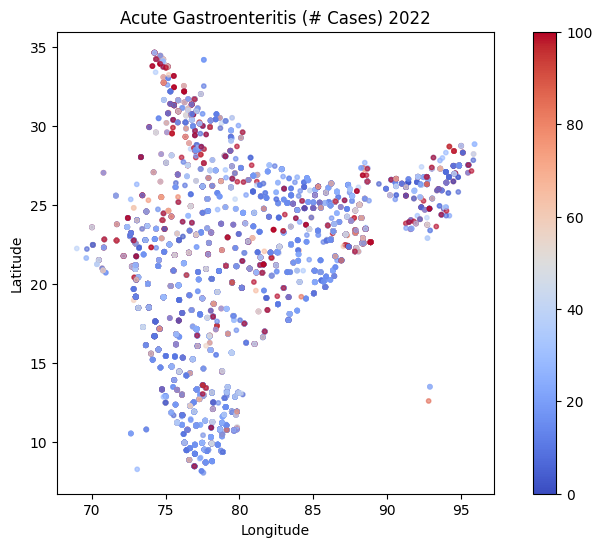

In [55]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
# Plotting state boundaries on each subplot
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Acute Gastroenteritis (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-56-570d109f35ef>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ag['Cases'] = pd.to_numeric(df_ag['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


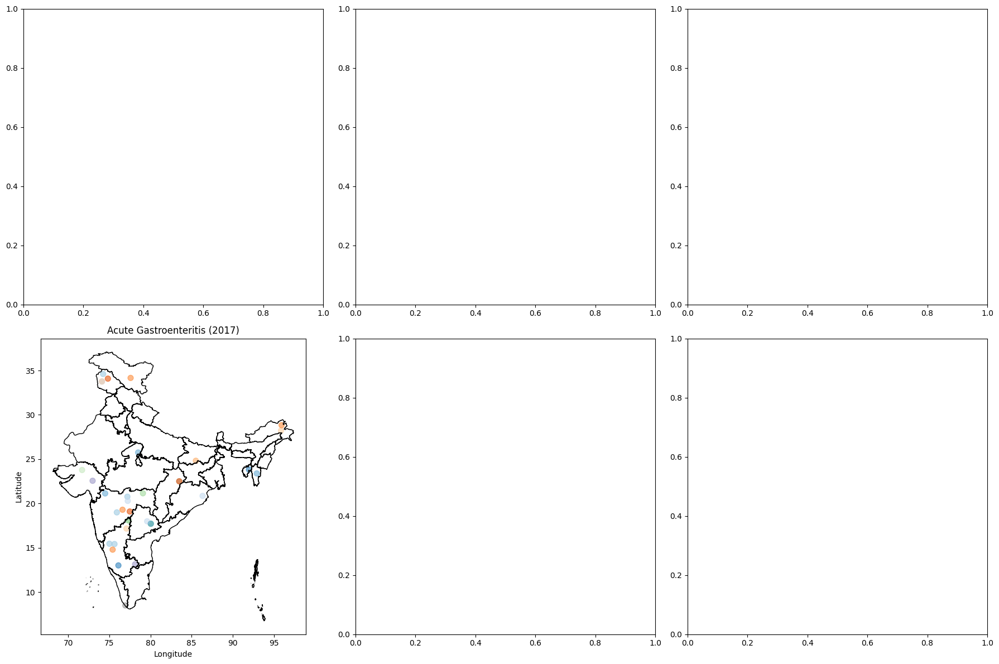

In [56]:
# First, filter the dataset for Acute Gastroenteritis and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_ag = df[(df['Disease'] == "Acute Gastroenteritis") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_ag['Cases'] = pd.to_numeric(df_ag['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_ag[df_ag['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Gastroenteritis ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-57-d536262228a2>:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


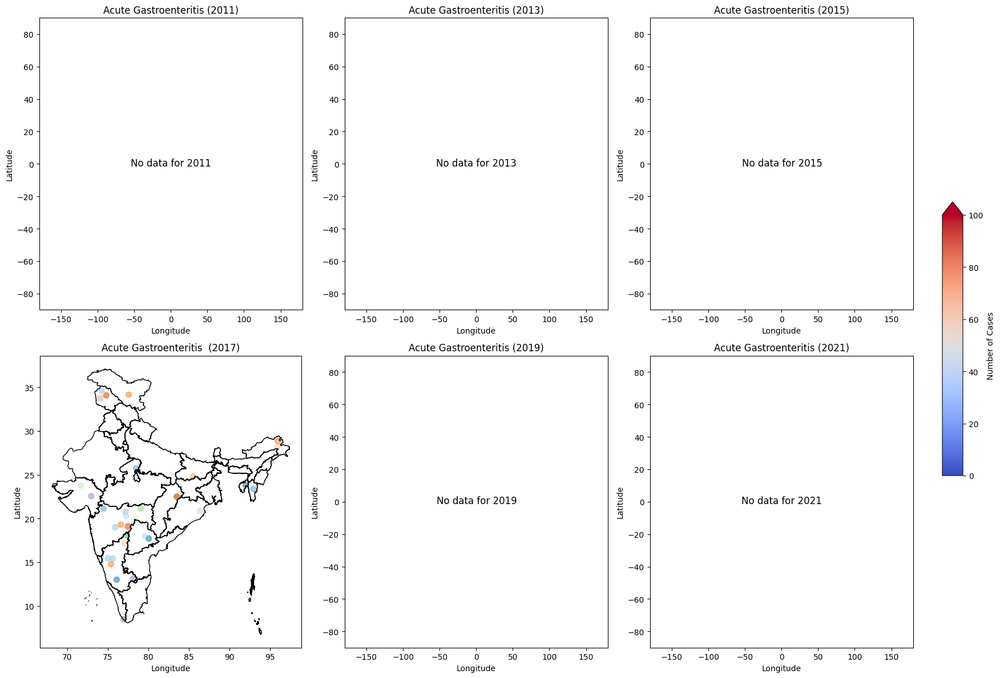

In [57]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_ag[df_ag['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Gastroenteritis  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Acute Gastroenteritis ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue
       

In [58]:
df_den = df[df.Disease == "Dengue"][df.year==2022]
df_den.head()

<ipython-input-58-5bea555ed663>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_den = df[df.Disease == "Dengue"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
23,23,10th week,Telangana,Nalgonda,Dengue,6.0,NaN,11,3,2022,16.857964,79.217494,0.000134,8.0,309.556
25,25,10th week,Kerala,Trivandrum,Dengue,9.0,NaN,22,2,2022,8.488227,76.947551,0.093704,46.0,301.496
26,26,10th week,Tamil Nadu,Ariyalur,Dengue,6.0,NaN,5,2,2022,11.076036,79.117455,0.012509,10.0,303.384
28,28,10th week,Tamil Nadu,Virudhunagar,Dengue,17.0,NaN,16,2,2022,9.520894,77.878456,0.307975,7.0,306.000
37,37,12th week,Maharashtra,Raigad,Dengue,11.0,NaN,21,3,2022,18.492809,73.138071,0.000180,NaN,312.184


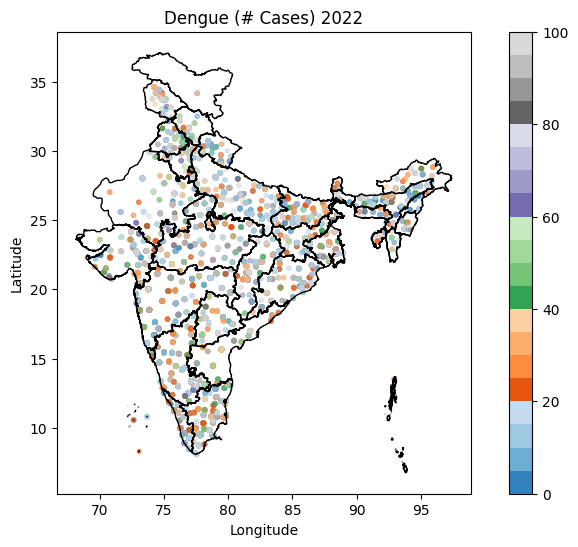

In [59]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
# Plotting state boundaries on each subplot
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-60-1ccf1d48b31b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_den['Cases'] = pd.to_numeric(df_den['Cases'], errors='coerce').fillna(0)


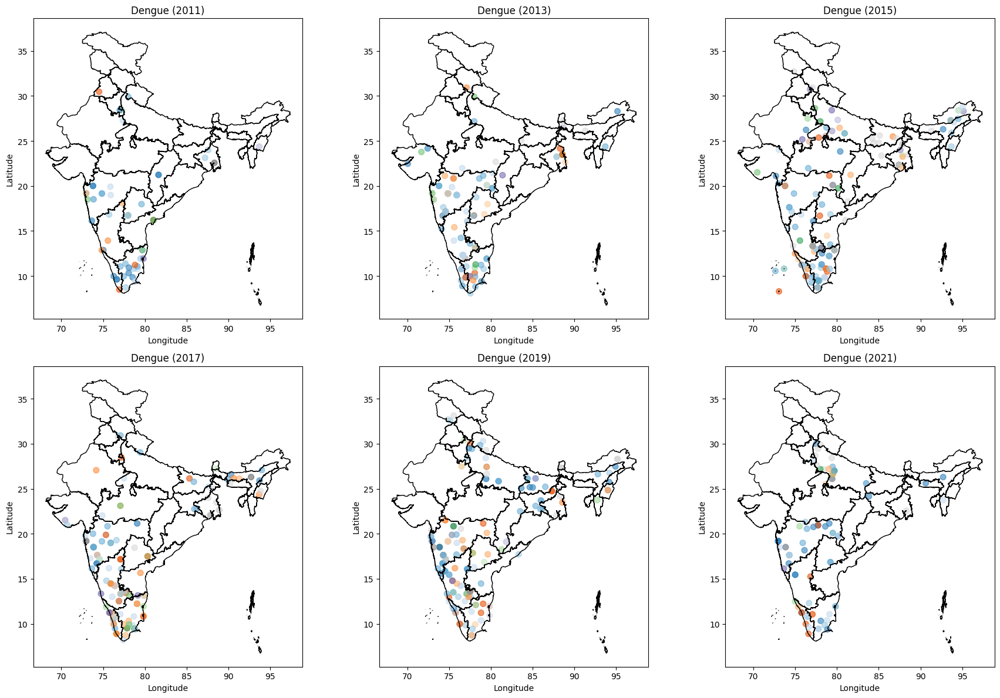

In [60]:
# First, filter the dataset for dengue and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_den = df[(df['Disease'] == "Dengue") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_den['Cases'] = pd.to_numeric(df_den['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_den[df_den['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-61-e9d9d4ed38e1>:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


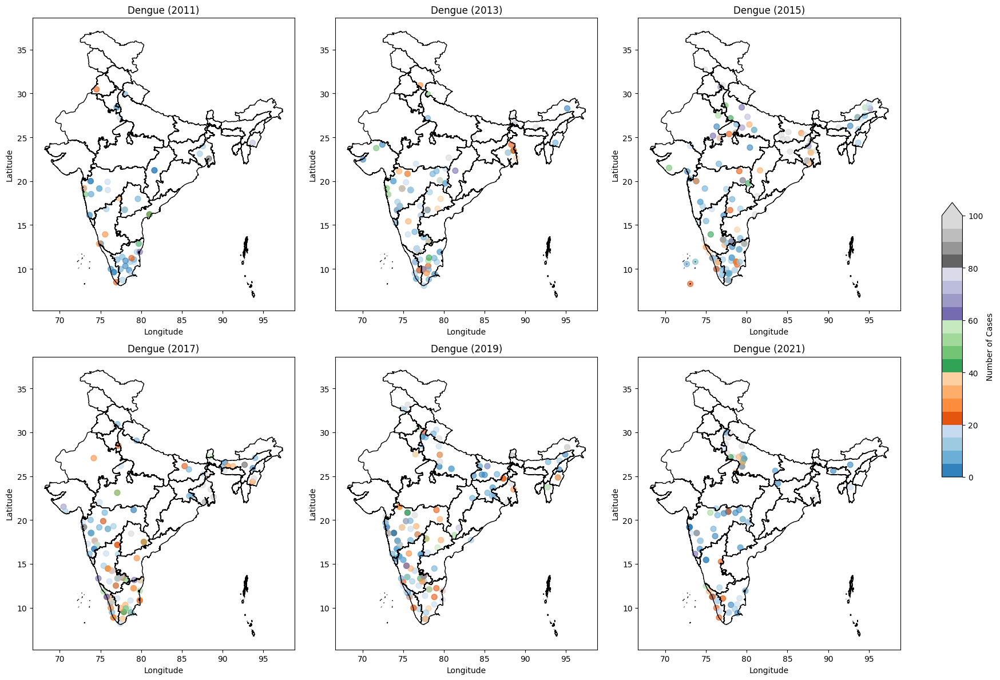

In [61]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_den[df_den['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        # Plotting state boundaries on each subplot
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Pyrexia of unknown origin

In [62]:
df_unpyr = df[df.Disease == "Pyrexia of unknown origin"][df.year==2022]
df_unpyr.head()

<ipython-input-62-d65b597386a4>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_unpyr = df[df.Disease == "Pyrexia of unknown origin"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


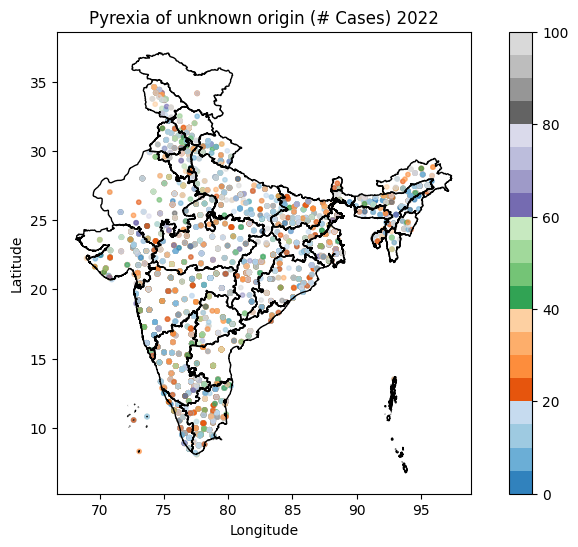

In [63]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
# Plotting state boundaries on each subplot
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Pyrexia of unknown origin (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


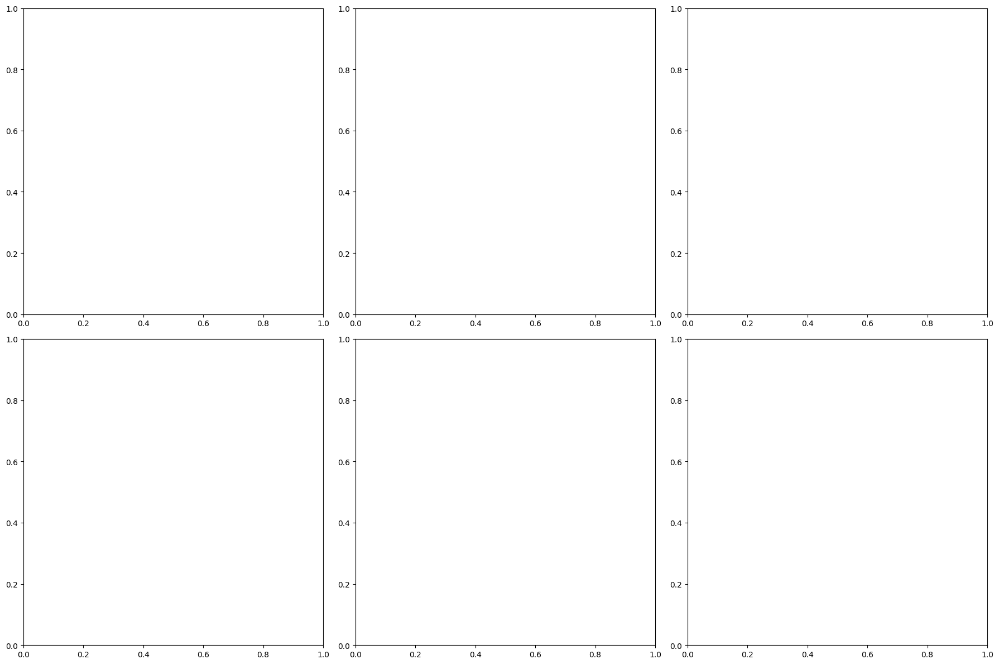

In [64]:
# First, filter the dataset for Pyrexia of unknown origin and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_unpyr = df[(df['Disease'] == "Pyrexia of unknown origin") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_unpyr['Cases'] = pd.to_numeric(df_unpyr['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_unpyr[df_unpyr['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Pyrexia of unknown origin ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-65-93422f40fb87>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


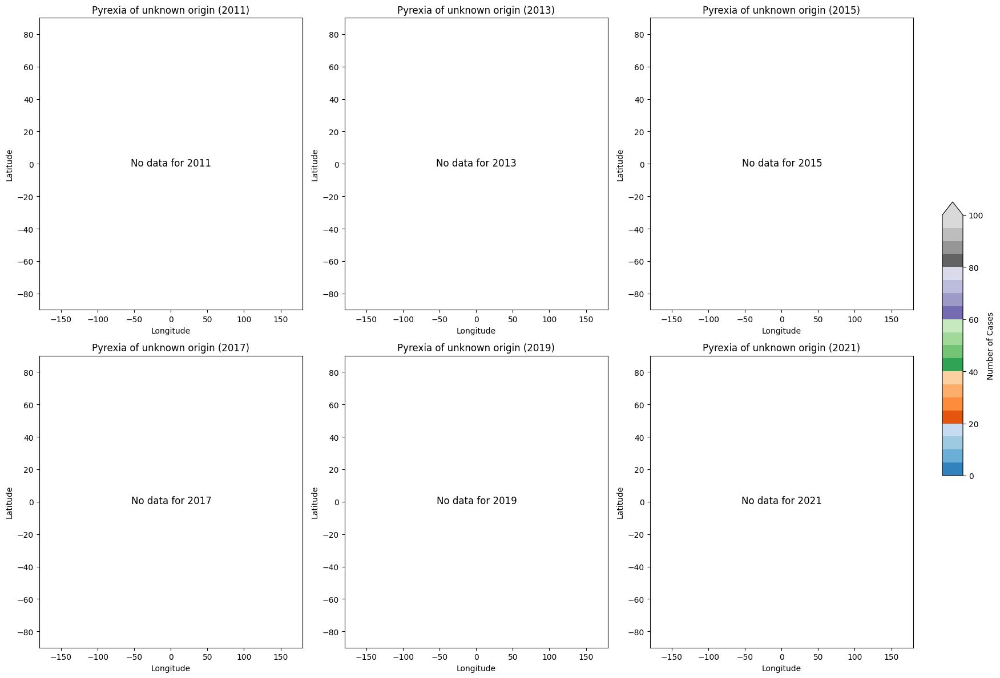

In [65]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_unpyr[df_unpyr['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Pyrexia of unknown origin  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Pyrexia of unknown origin ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Chikungunya

In [66]:
df_chi = df[df.Disease == "Chikungunya"][df.year==2022]
df_chi.head()

<ipython-input-66-9aaeb0fe5ab6>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_chi = df[df.Disease == "Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
32,32,11th week,Maharashtra,Akola,Chikungunya,9.0,NaN,12,3,2022,20.761812,77.192116,0.011402,5.0,311.466667
128,128,22nd week,Karnataka,Vijayapura,Chikungunya,13.0,NaN,1,6,2022,16.666667,75.916667,0.008072,NaN,312.472000
137,137,22nd week,Maharashtra,Satara,Chikungunya,5.0,NaN,31,5,2022,17.636129,74.298278,0.005179,5.0,315.364000
160,160,23rd week,Maharashtra,Satara,Chikungunya,5.0,NaN,3,6,2022,17.636129,74.298278,0.029202,5.0,311.508000
170,170,23rd week,Maharashtra,Jalgaon,Chikungunya,9.0,NaN,23,5,2022,20.842883,75.526125,0.000208,3.0,315.880000


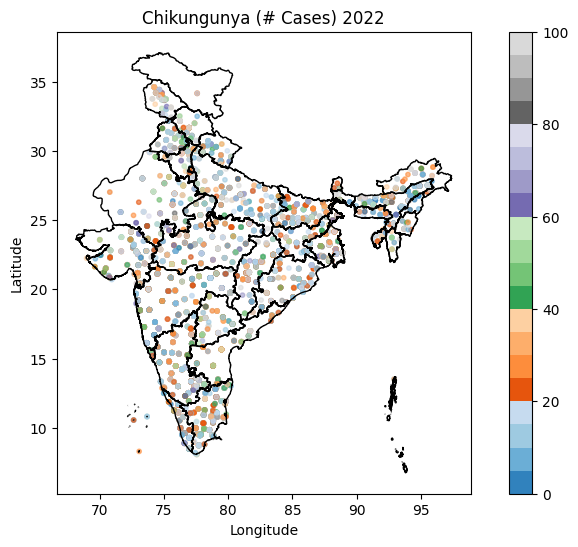

In [67]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-68-c7275961b098>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_chi['Cases'] = pd.to_numeric(df_chi['Cases'], errors='coerce').fillna(0)


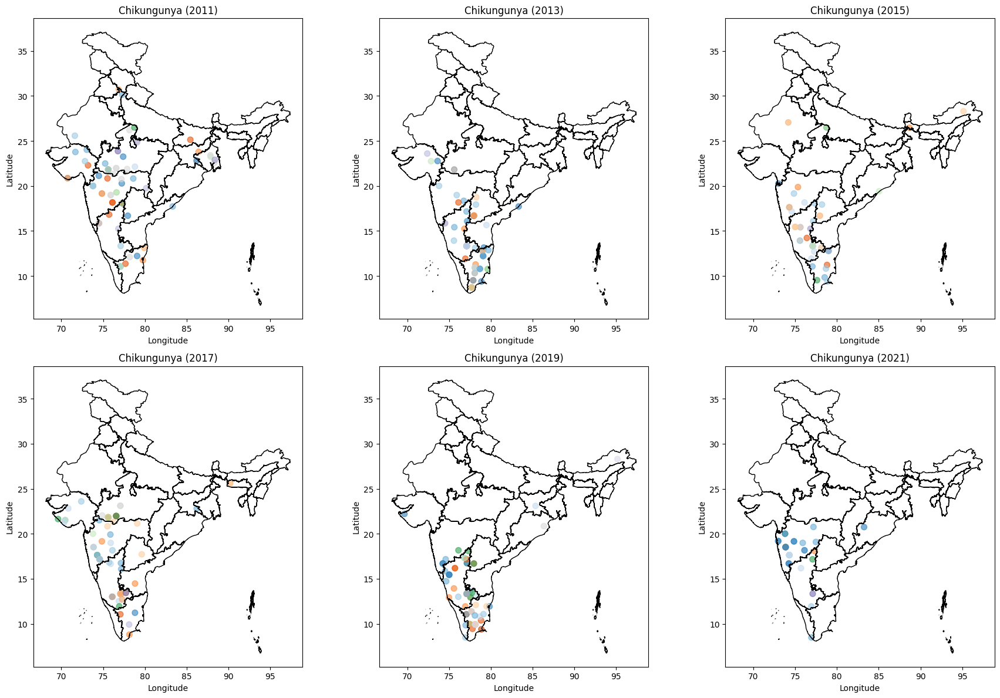

In [68]:
# First, filter the dataset for Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_chi = df[(df['Disease'] == "Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_chi['Cases'] = pd.to_numeric(df_chi['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_chi[df_chi['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-69-c9b90cb644a0>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


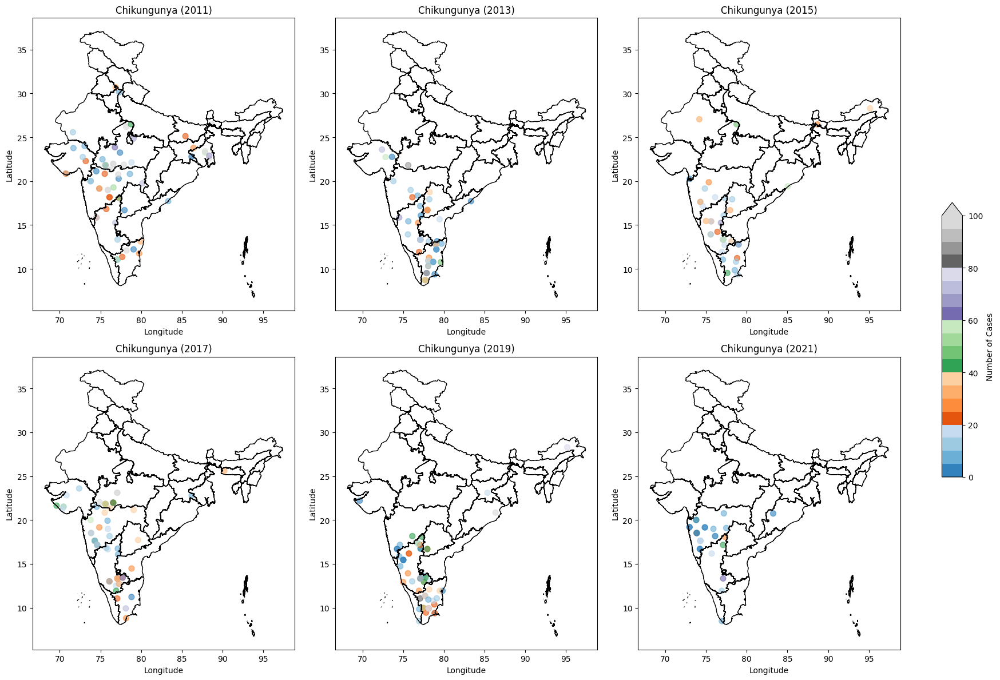

In [69]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_chi[df_chi['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Cholera

In [70]:
df_cho = df[df.Disease == "Cholera"][df.year==2022]
df_cho.head()

<ipython-input-70-8685ee7e0e41>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_cho = df[df.Disease == "Cholera"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
51,51,14th week,West Bengal,Hooghly,Cholera,50.0,NaN,6,4,2022,22.905211,88.376064,0.016061,NaN,301.768000
62,62,16th week,Odisha,Ganjam,Cholera,23.0,NaN,21,4,2022,19.412971,85.047104,NaN,11.0,304.553333
65,65,16th week,West Bengal,Howrah,Cholera,53.0,NaN,17,4,2022,22.573630,88.325104,0.002076,10.0,305.268000
86,86,19th week,Karnataka,Kalaburagi,Cholera,144.0,NaN,7,5,2022,17.166667,77.083333,0.006688,3.0,318.132000
165,165,23rd week,Tamil Nadu,Tiruchirappalli,Cholera,17.0,NaN,6,6,2022,10.799225,78.681142,0.058260,9.0,308.190000


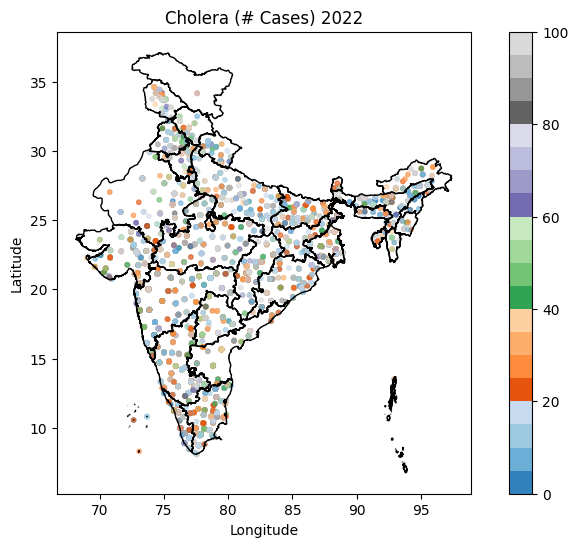

In [71]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Cholera (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-72-0ccd3332e190>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cho['Cases'] = pd.to_numeric(df_cho['Cases'], errors='coerce').fillna(0)


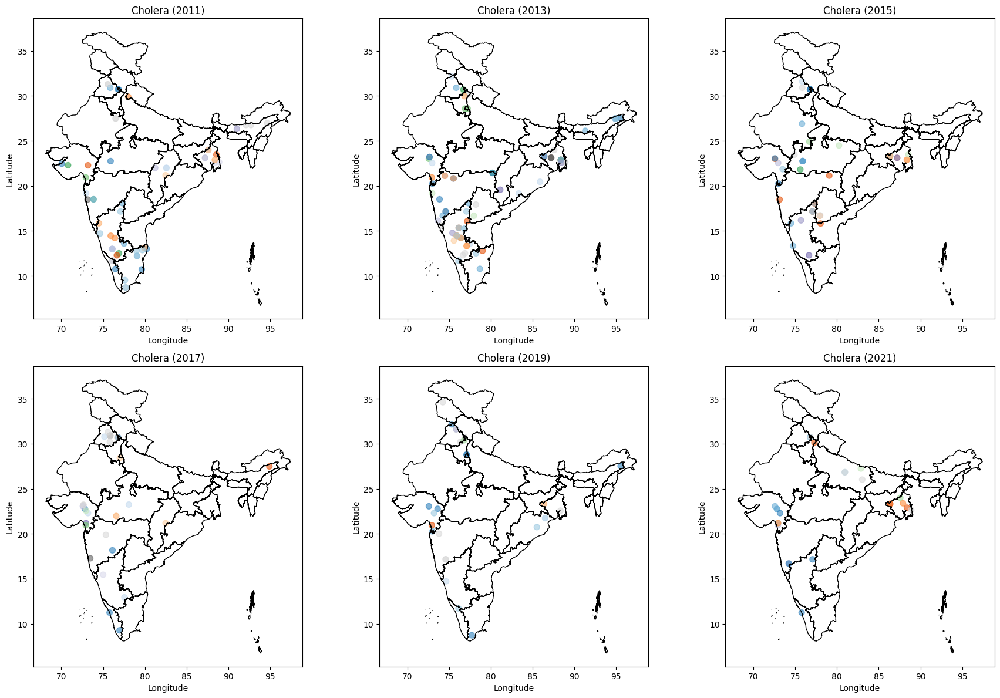

In [72]:
# First, filter the dataset for Cholera and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_cho = df[(df['Disease'] == "Cholera") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_cho['Cases'] = pd.to_numeric(df_cho['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_cho[df_cho['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-73-861323e86ee7>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


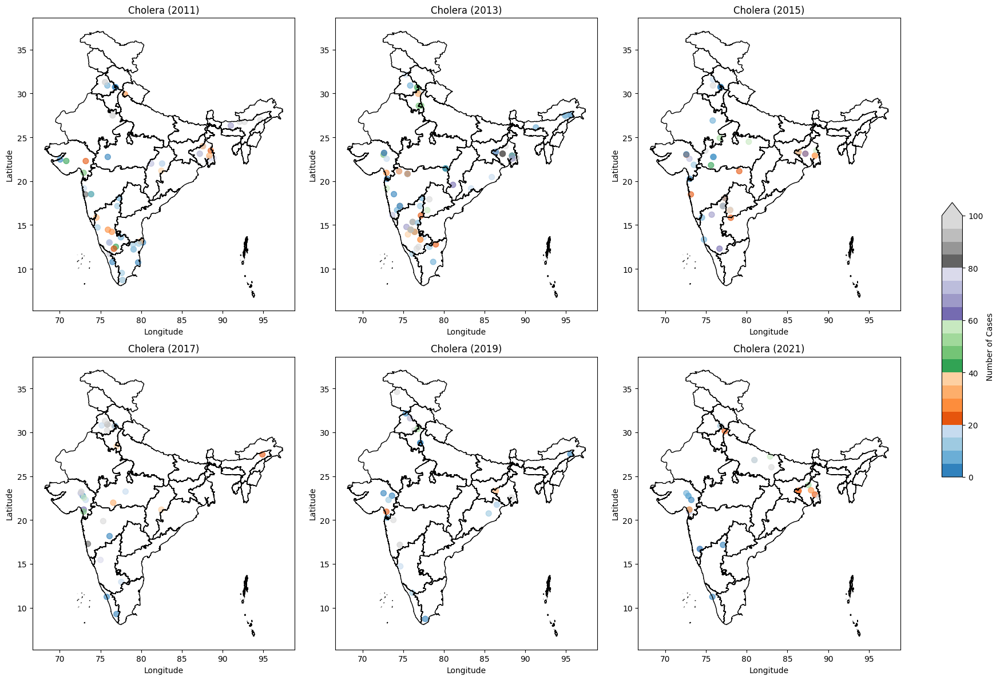

In [73]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_cho[df_cho['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Malaria (PV)

In [74]:
df_mal = df[df.Disease == "Malaria(PV)"][df.year==2022]
df_mal.head()

<ipython-input-74-f037681eac6e>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_mal = df[df.Disease == "Malaria(PV)"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


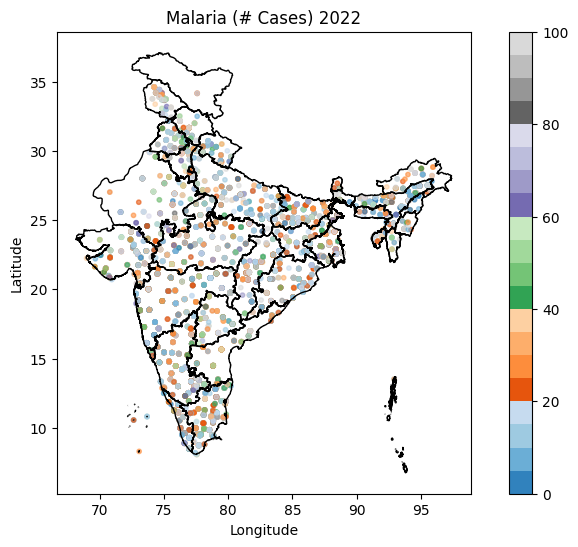

In [75]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Malaria (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-76-414077a4f707>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mal['Cases'] = pd.to_numeric(df_mal['Cases'], errors='coerce').fillna(0)


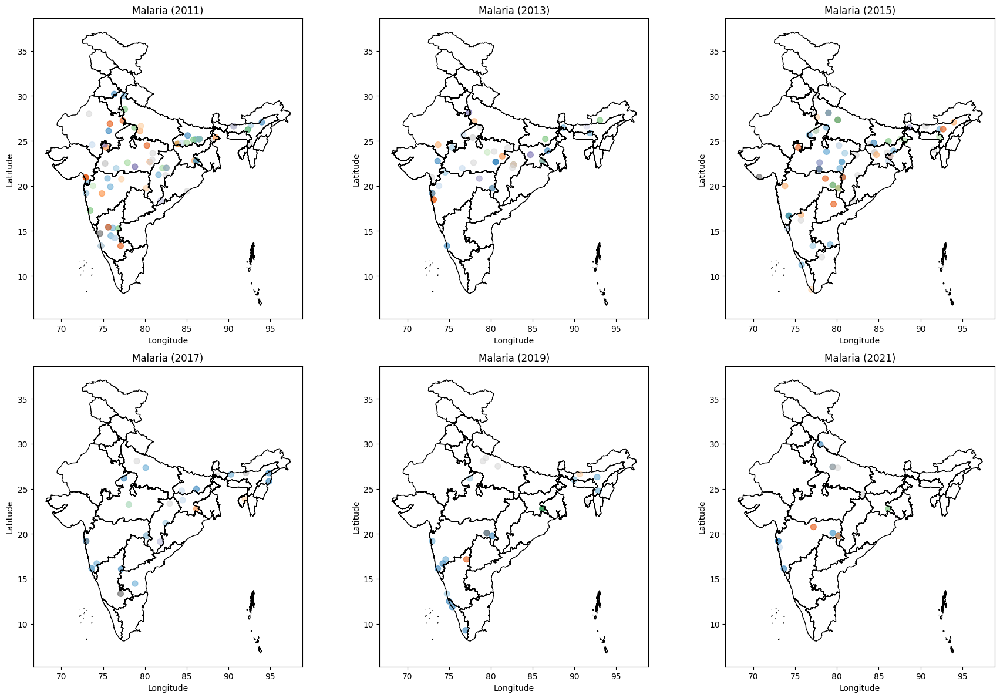

In [76]:
# First, filter the dataset for Malaria and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_mal = df[(df['Disease'] == "Malaria") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_mal['Cases'] = pd.to_numeric(df_mal['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_mal[df_mal['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-77-620bd750ae62>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


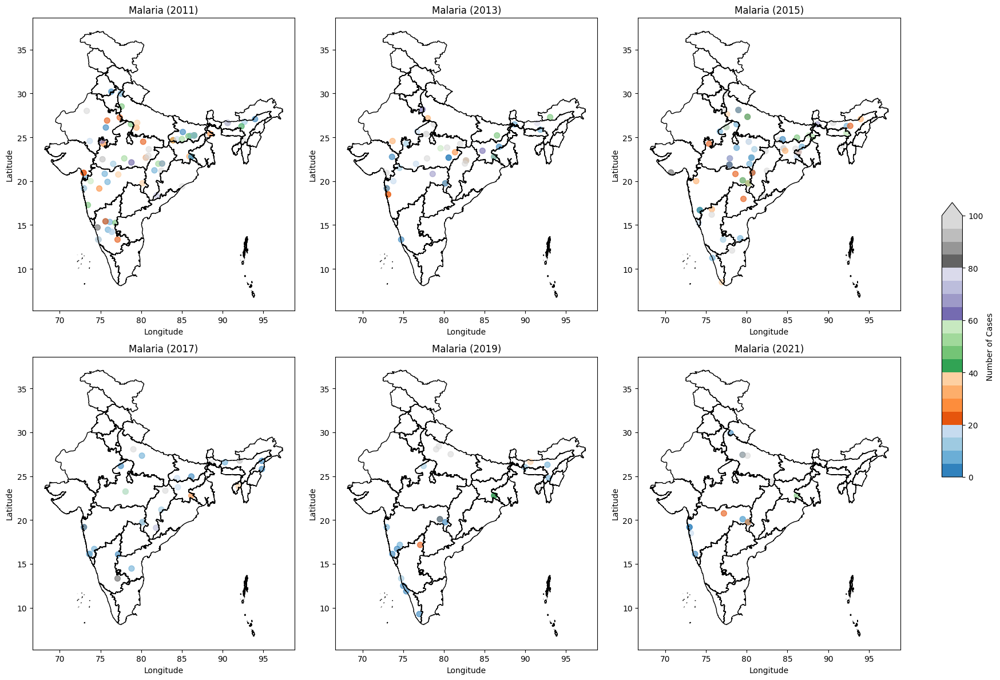

In [77]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_mal[df_mal['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue Fever

In [78]:
df_denfev = df[df.Disease == "Dengue Fever"][df.year==2022]
df_denfev.head()

<ipython-input-78-db5c4088896c>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_denfev = df[df.Disease == "Dengue Fever"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


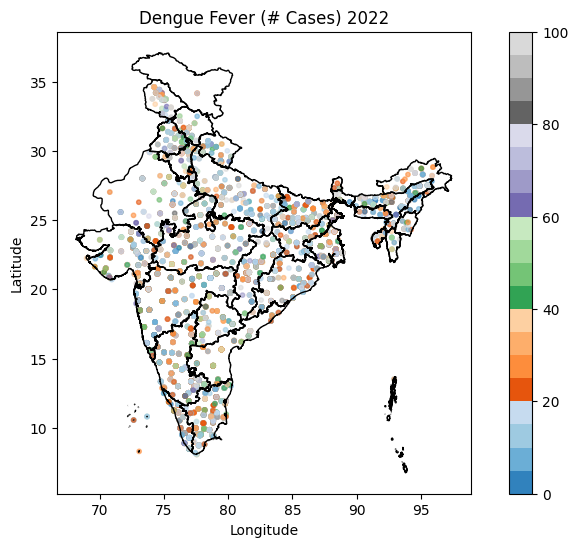

In [79]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue Fever (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-80-aa84542ad703>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_denfev['Cases'] = pd.to_numeric(df_denfev['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


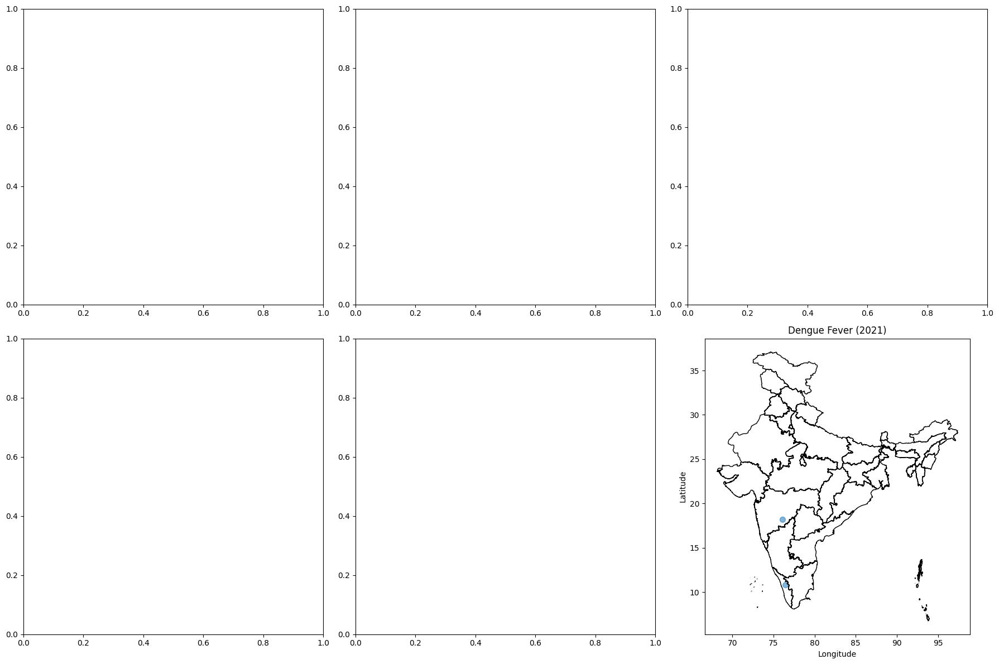

In [80]:
# First, filter the dataset for Dengue Fever and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_denfev = df[(df['Disease'] == "Dengue Fever") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_denfev['Cases'] = pd.to_numeric(df_denfev['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_denfev[df_denfev['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue Fever ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-81-8126a1be4faa>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


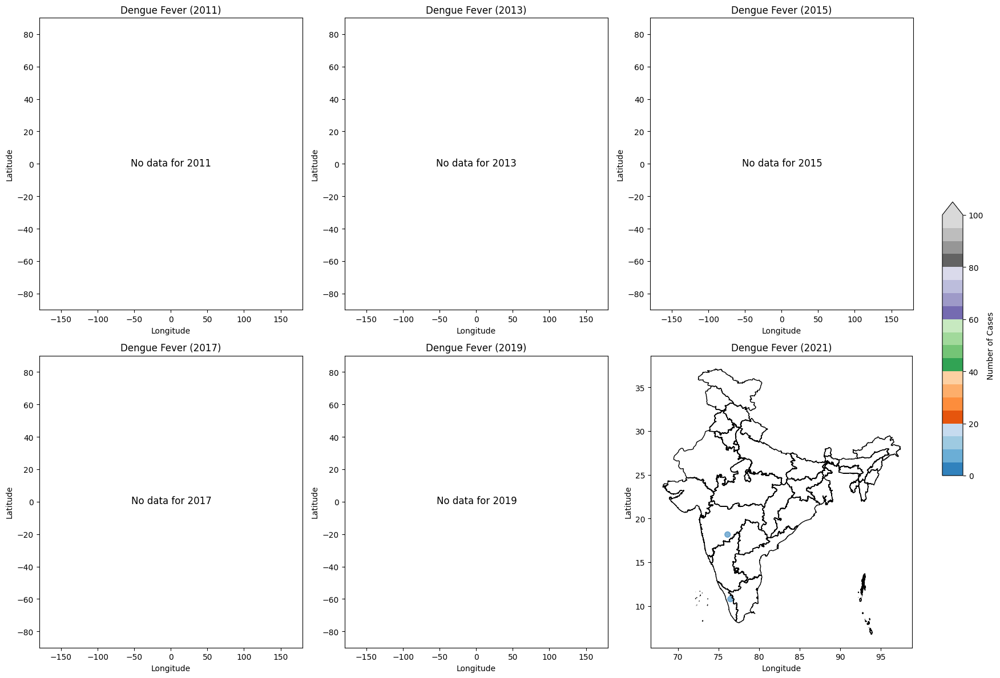

In [81]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_denfev[df_denfev['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue Fever ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue Fever ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Suspected Dengue

In [82]:
df_sden = df[df.Disease == "Suspected Dengue"][df.year==2022]
df_sden.head()

<ipython-input-82-ecf127af90eb>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_sden = df[df.Disease == "Suspected Dengue"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


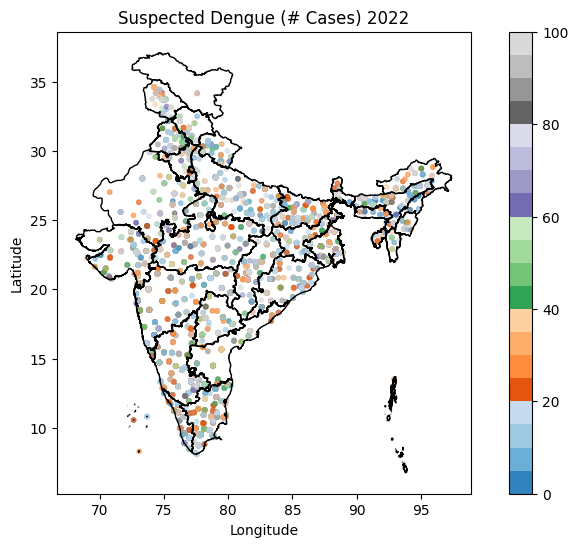

In [83]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Suspected Dengue (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-84-f6757ba4c78e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sden['Cases'] = pd.to_numeric(df_sden['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


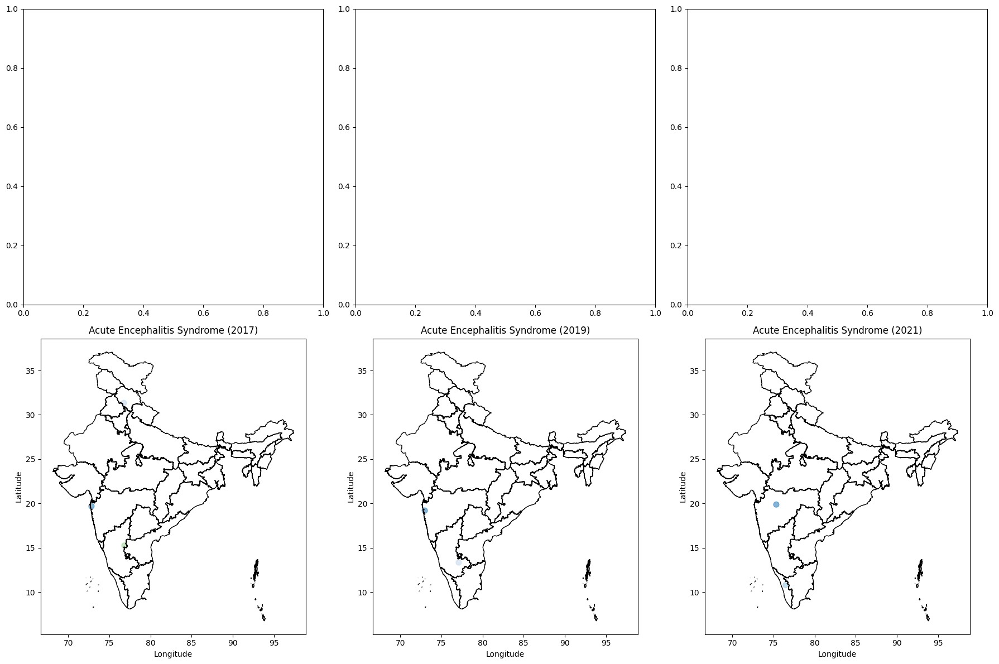

In [84]:
# First, filter the dataset for Suspected Dengue and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_sden = df[(df['Disease'] == "Suspected Dengue") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_sden['Cases'] = pd.to_numeric(df_sden['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_sden[df_sden['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Acute Encephalitis Syndrome ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-85-522c071c92b1>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


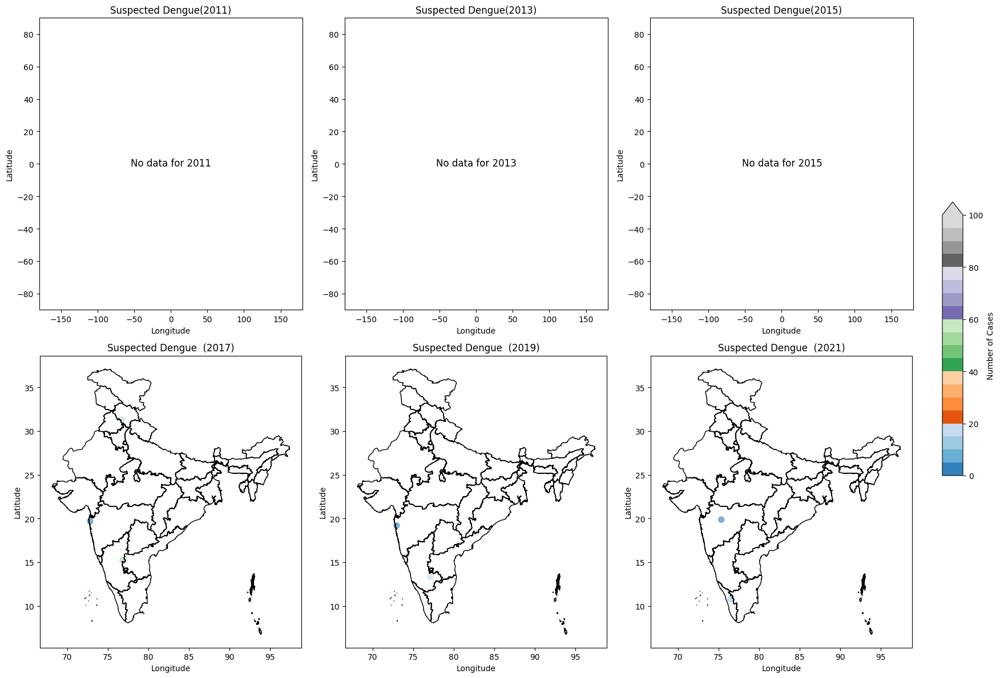

In [85]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_sden[df_sden['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Dengue  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Suspected Dengue({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue Chikungunya

In [86]:
df_dc = df[df.Disease == "Dengue Chikungunya"][df.year==2022]
df_dc.head()

<ipython-input-86-edcfc7d11d27>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_dc = df[df.Disease == "Dengue Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


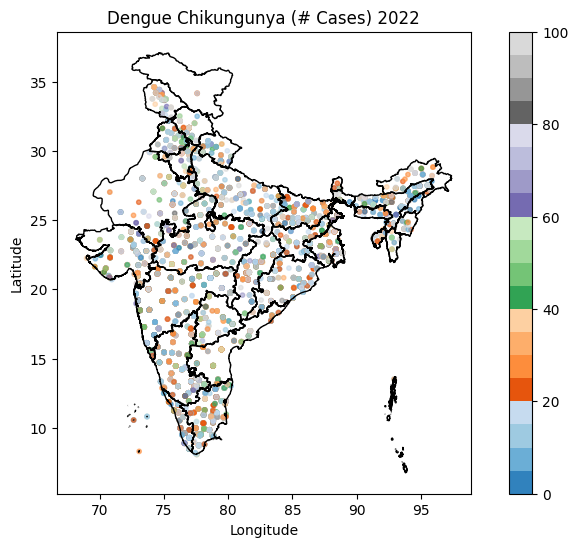

In [87]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-88-d2b42e009b5a>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dc['Cases'] = pd.to_numeric(df_dc['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


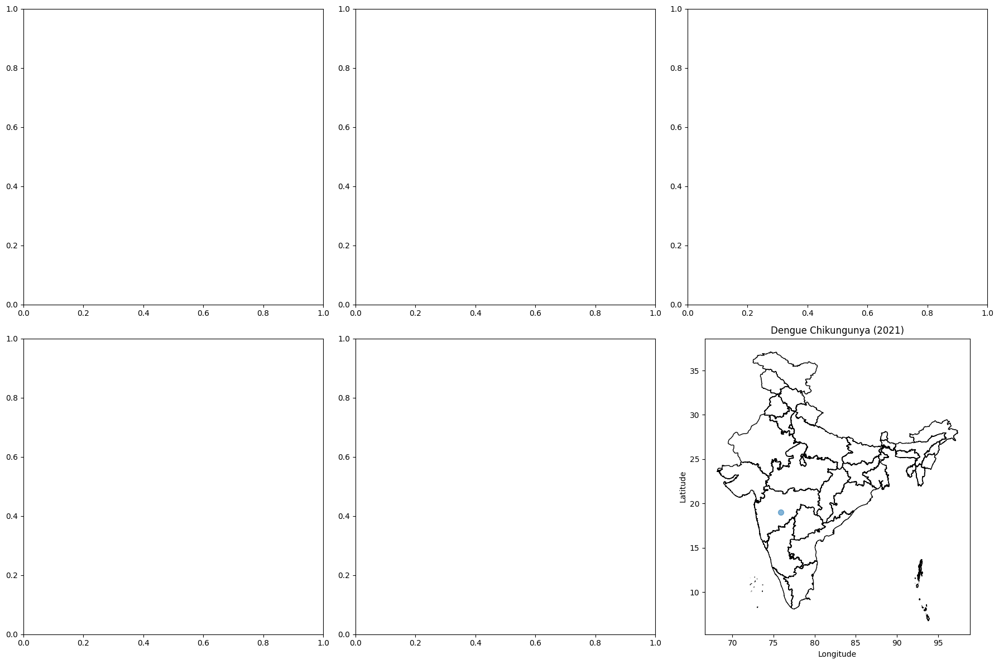

In [88]:
# First, filter the dataset for Dengue Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_dc = df[(df['Disease'] == "Dengue Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_dc['Cases'] = pd.to_numeric(df_dc['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dc[df_dc['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-89-40641dfec08f>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


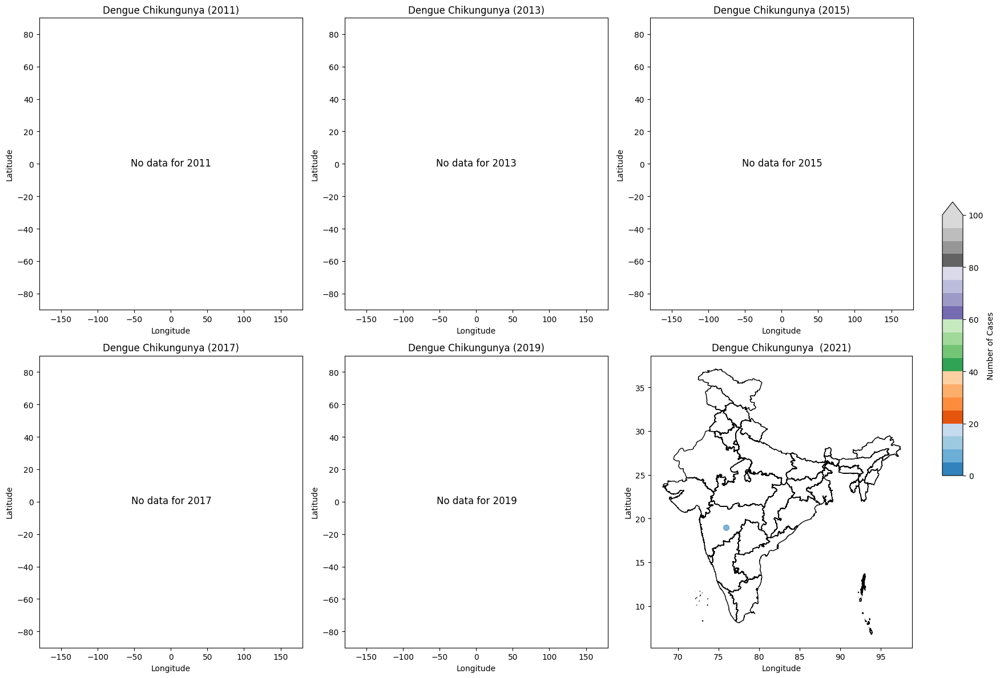

In [89]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dc[df_dc['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue Chikungunya  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue And Chikungunya

In [90]:
df_dac = df[df.Disease == "Dengue and Chikungunya"][df.year==2022]
df_dac.head()

<ipython-input-90-fdb3cb65f3fb>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_dac = df[df.Disease == "Dengue and Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


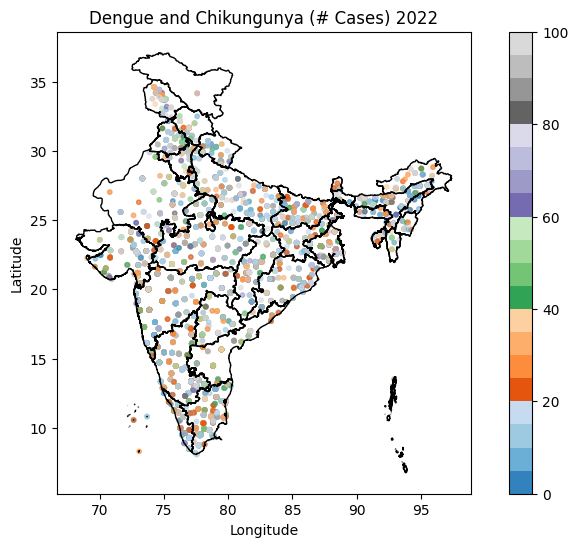

In [91]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue and Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


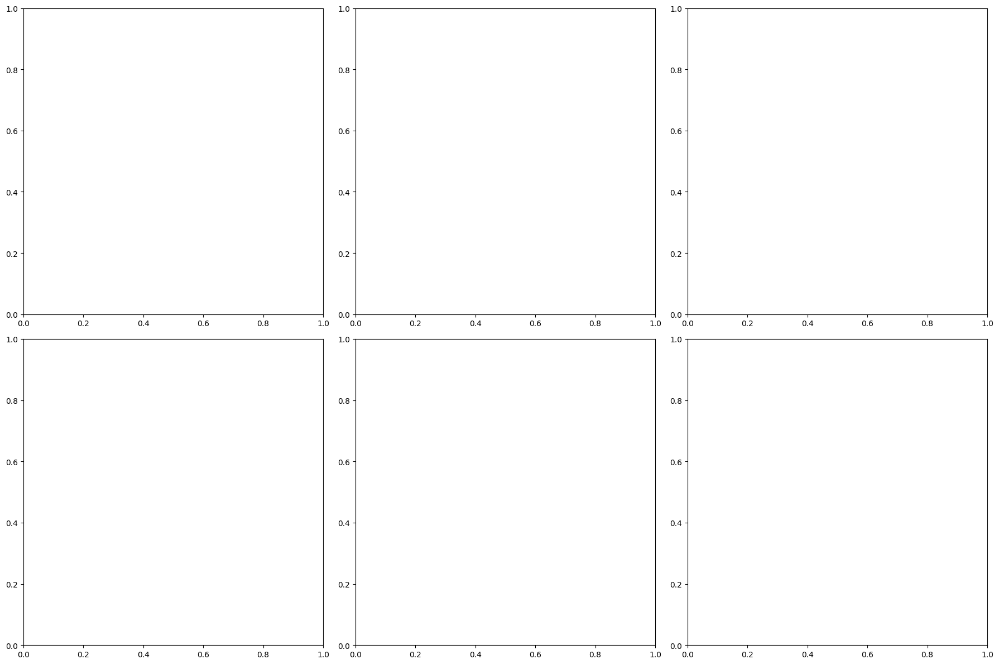

In [92]:
# First, filter the dataset for Dengue and Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_dac = df[(df['Disease'] == "Dengue and Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_dac['Cases'] = pd.to_numeric(df_dac['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dac[df_dac['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue and Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-93-2241b6003cb5>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


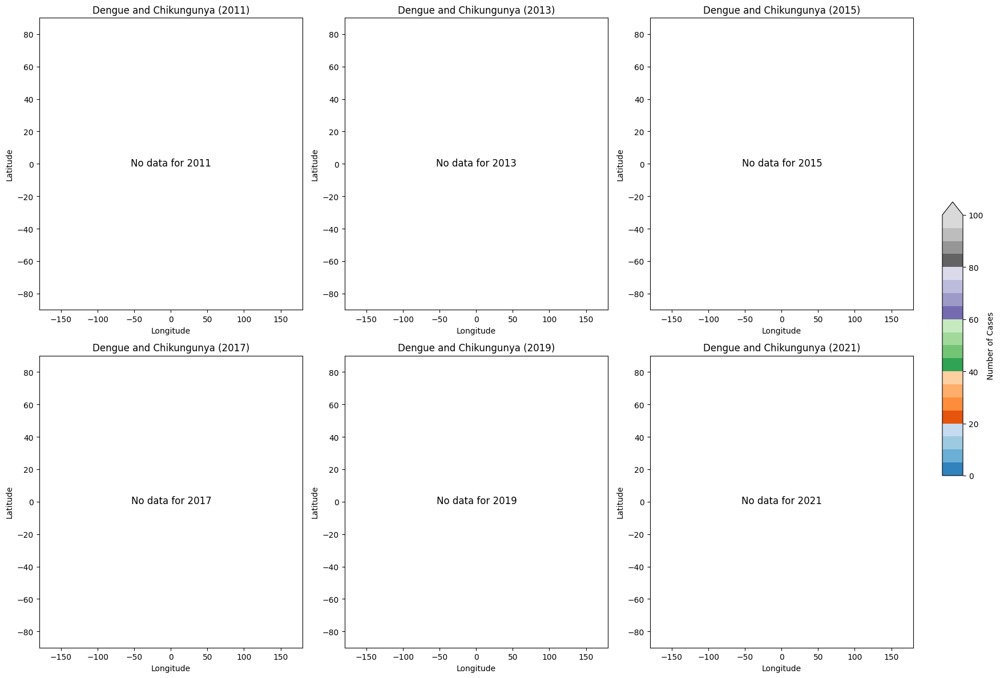

In [93]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dac[df_dac['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue and Chikungunya  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue and Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Suspected Cholera

In [94]:
df_scho = df[df.Disease == "Suspected Cholera"][df.year==2022]
df_scho.head()

<ipython-input-94-f339e7872f09>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_scho = df[df.Disease == "Suspected Cholera"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


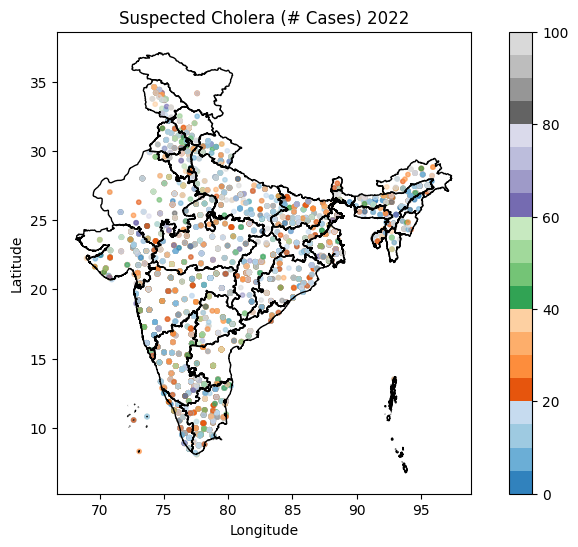

In [95]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Suspected Cholera (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-96-55bf91b459e0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scho['Cases'] = pd.to_numeric(df_scho['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


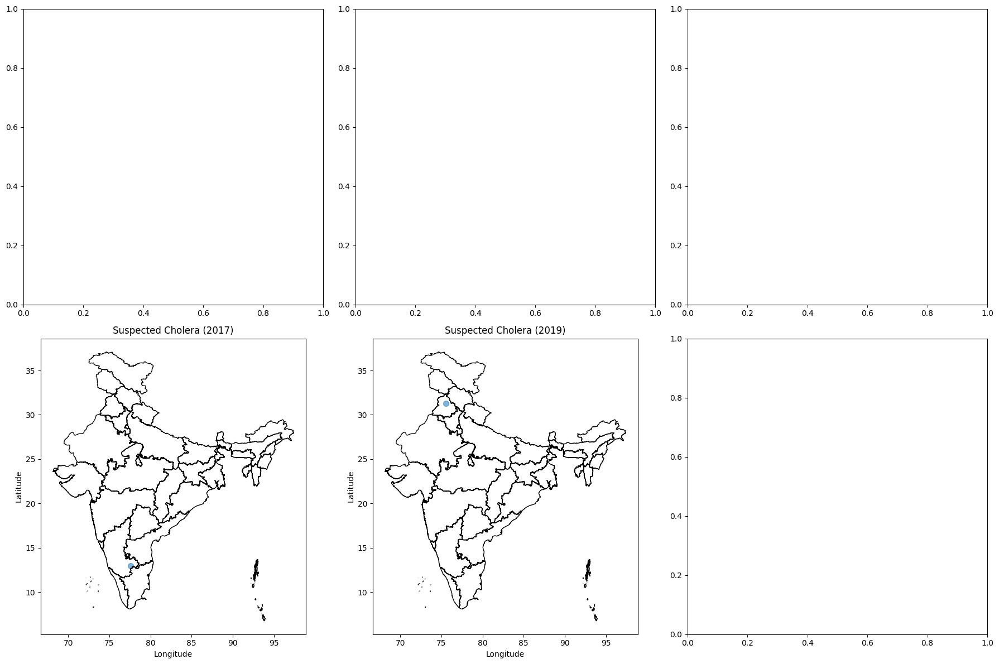

In [96]:
# First, filter the dataset for Dengue Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_scho = df[(df['Disease'] == "Suspected Cholera") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_scho['Cases'] = pd.to_numeric(df_scho['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_scho[df_scho['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-97-6b392ff43f54>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


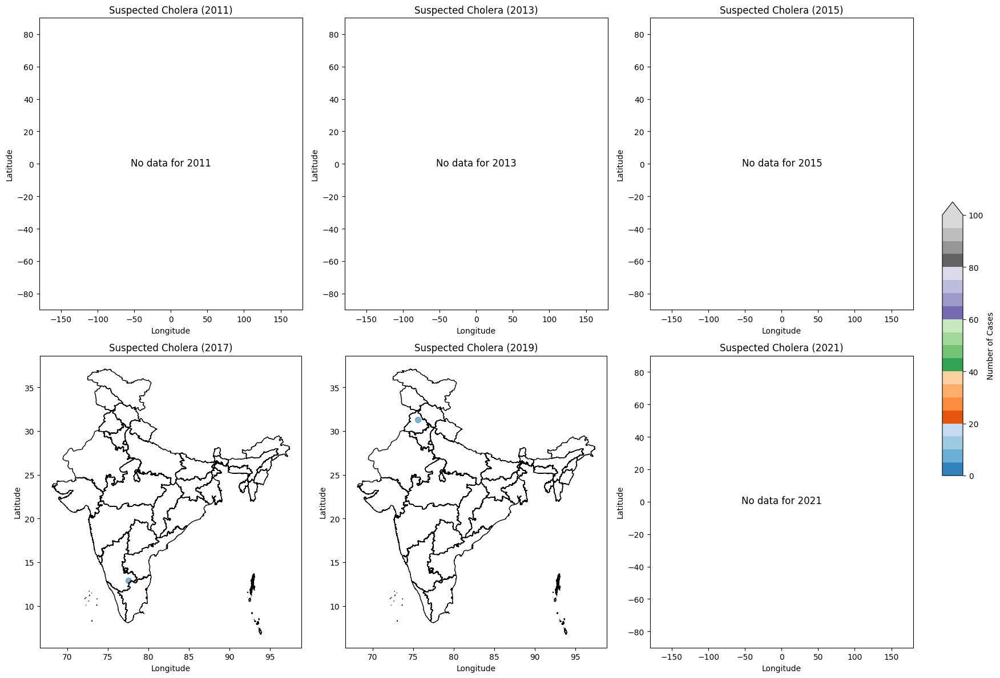

In [97]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_scho[df_scho['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Suspected Cholera ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Diarrhea

In [98]:
df_dia = df[df.Disease == "Diarrhea"][df.year==2022]
df_dia.head()

<ipython-input-98-6b048d678237>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_dia = df[df.Disease == "Diarrhea"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


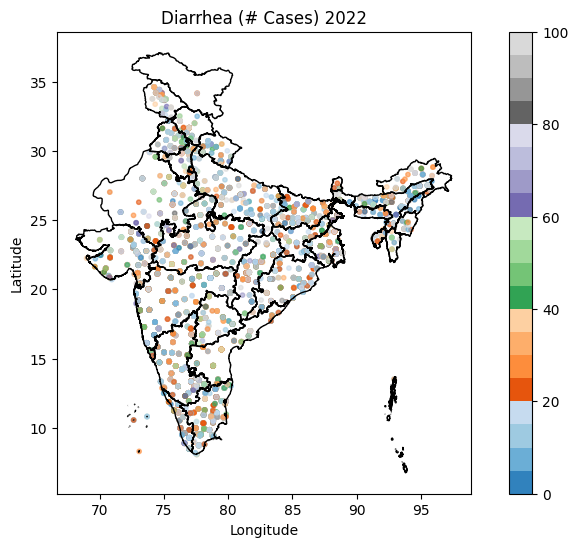

In [99]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Diarrhea (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


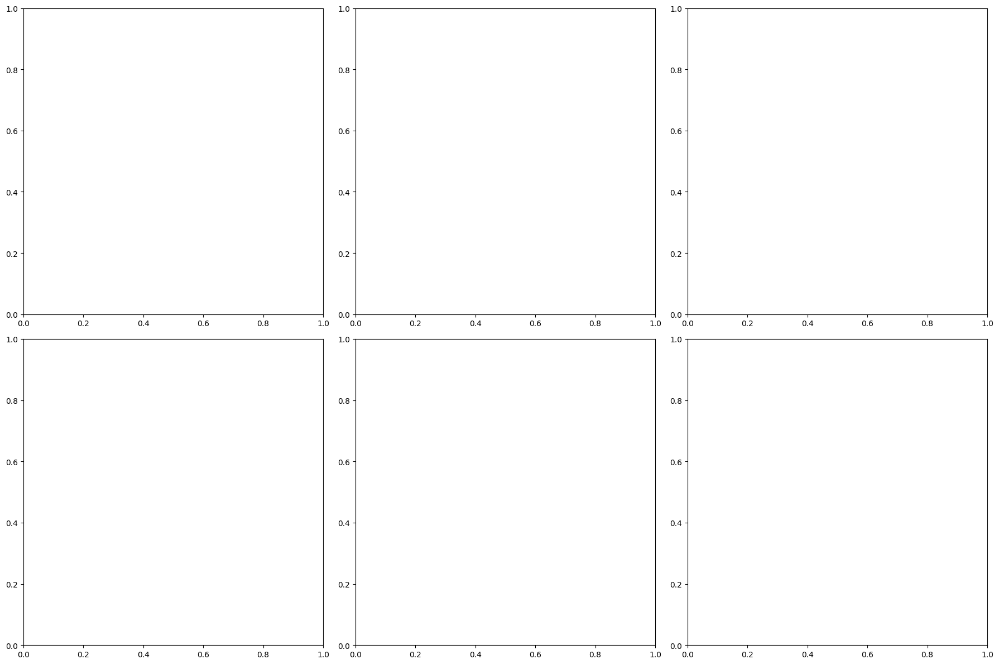

In [100]:
# First, filter the dataset for Diarrhea and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_dia = df[(df['Disease'] == "Diarrhea") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_dia['Cases'] = pd.to_numeric(df_dia['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dia[df_dia['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Diarrhea ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-101-62cc46cf5348>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


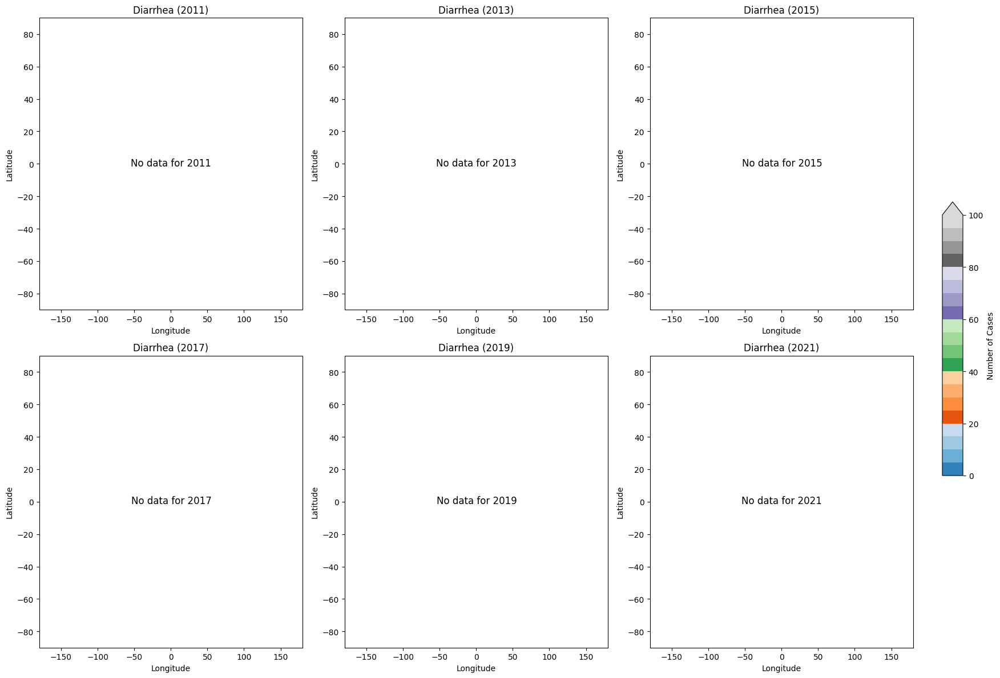

In [101]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dia[df_dia['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Diarrhea ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Diarrhea ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Suspected Chikungunya

In [102]:
df_schi = df[df.Disease == "Suspected Chikungunya"][df.year==2022]
df_schi.head()

<ipython-input-102-a5af1e4d3d42>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_schi = df[df.Disease == "Suspected Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


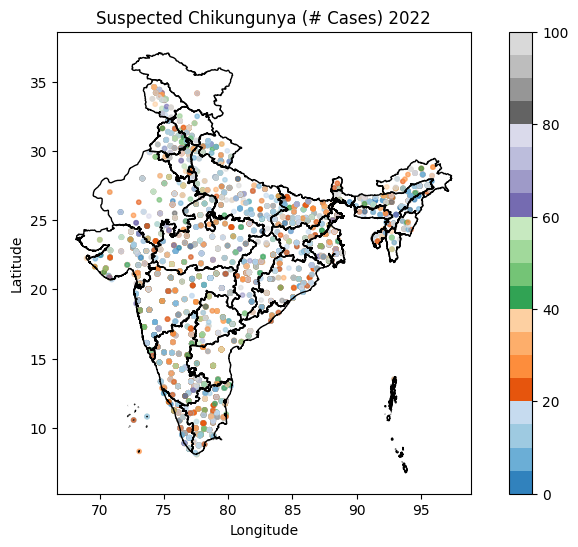

In [103]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Suspected Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

<ipython-input-104-562f1a1b69c2>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_schi['Cases'] = pd.to_numeric(df_schi['Cases'], errors='coerce').fillna(0)


No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


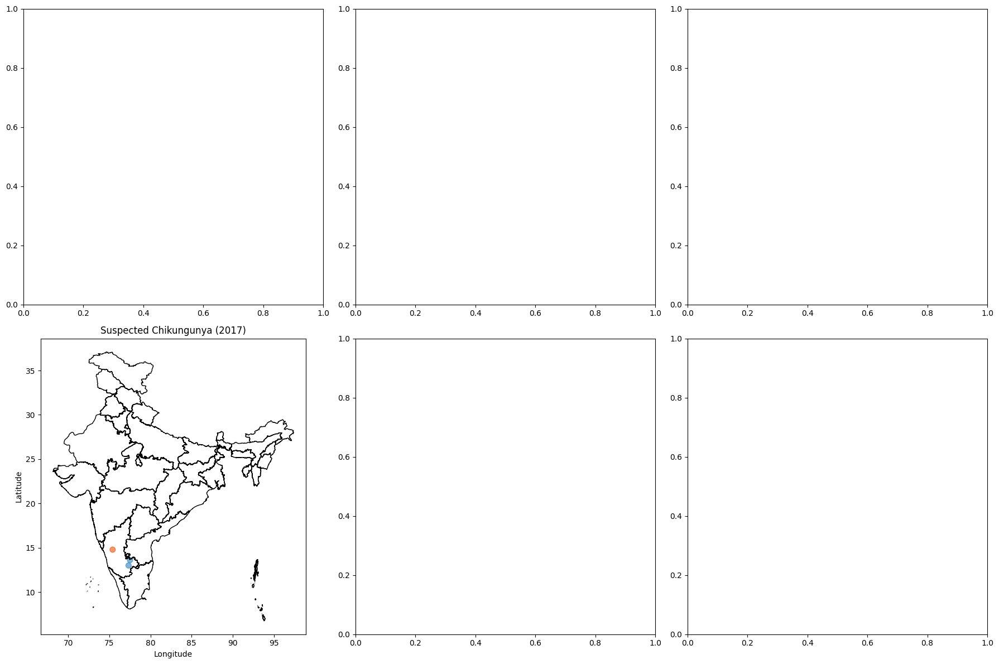

In [104]:
# First, filter the dataset for Suspected Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_schi = df[(df['Disease'] == "Suspected Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_schi['Cases'] = pd.to_numeric(df_schi['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_schi[df_schi['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-105-2704b83ffa72>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


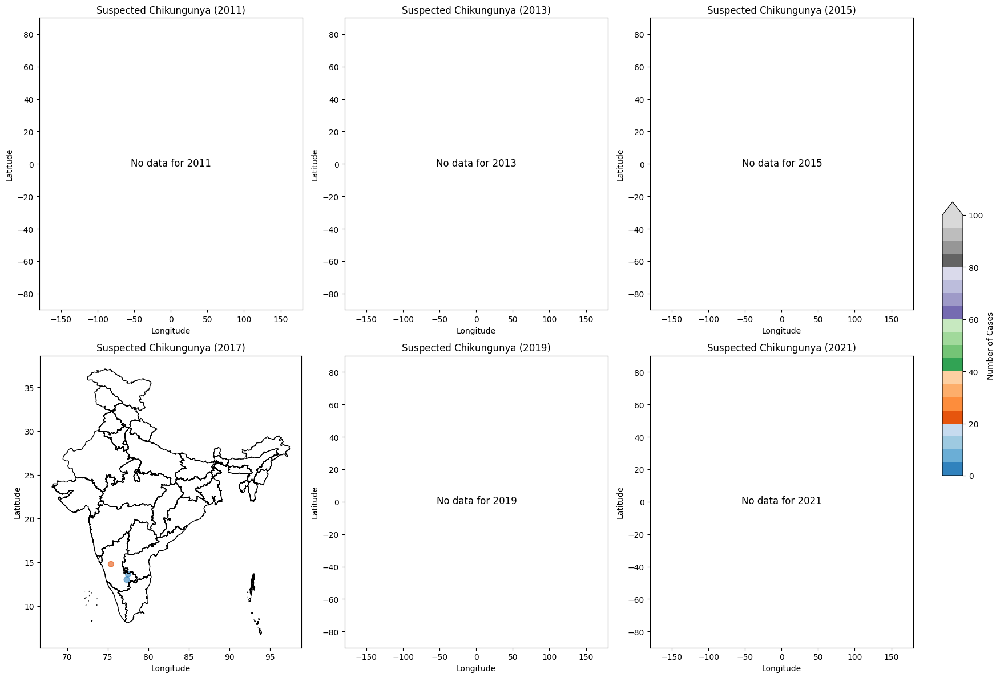

In [105]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_schi[df_schi['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Suspected Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Suspected Dengue And Chikungunya

In [106]:
df_sdac = df[df.Disease == "Suspected Dengue and Chikungunya"][df.year==2022]
df_sdac.head()

<ipython-input-106-1d08bcf67b5f>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_sdac = df[df.Disease == "Suspected Dengue and Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


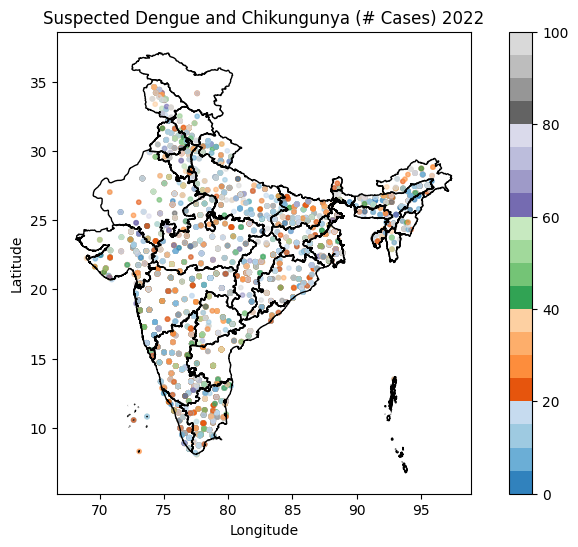

In [107]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Suspected Dengue and Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


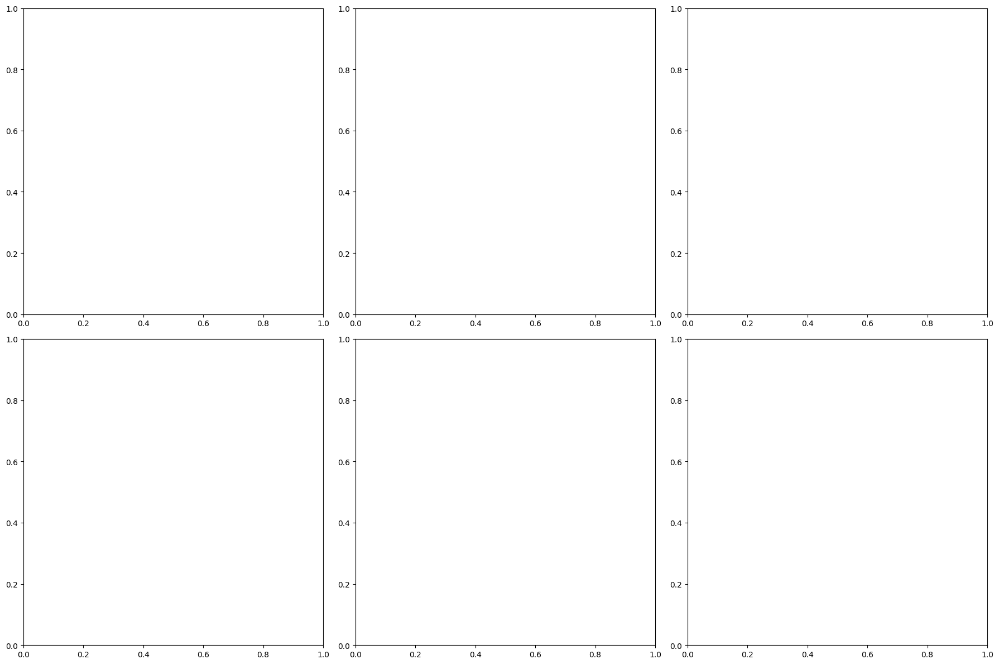

In [108]:
# First, filter the dataset for Suspected Dengue and Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_sdac = df[(df['Disease'] == "Suspected Dengue and Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_sdac['Cases'] = pd.to_numeric(df_sdac['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_sdac[df_sdac['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Dengue and Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-109-4669fcdc67fc>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


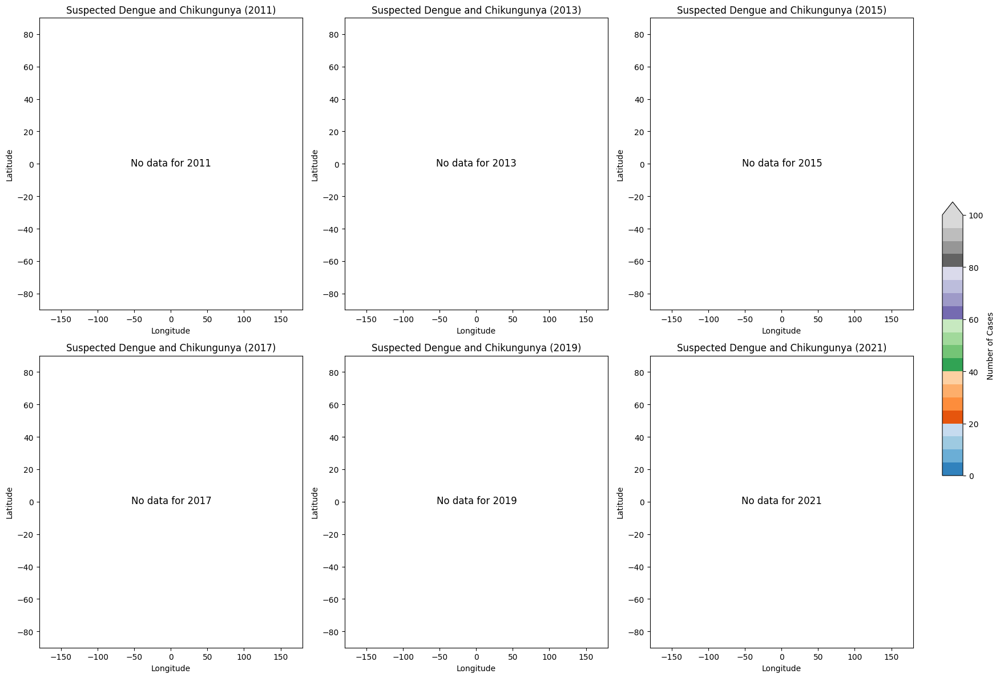

In [109]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_sdac[df_sdac['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Suspected Dengue and Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Suspected Dengue and Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Gastroenteritis

In [110]:
df_gas = df[df.Disease == "Gastroenteritis"][df.year==2022]
df_gas.head()

<ipython-input-110-c4868d6fbde8>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_gas = df[df.Disease == "Gastroenteritis"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


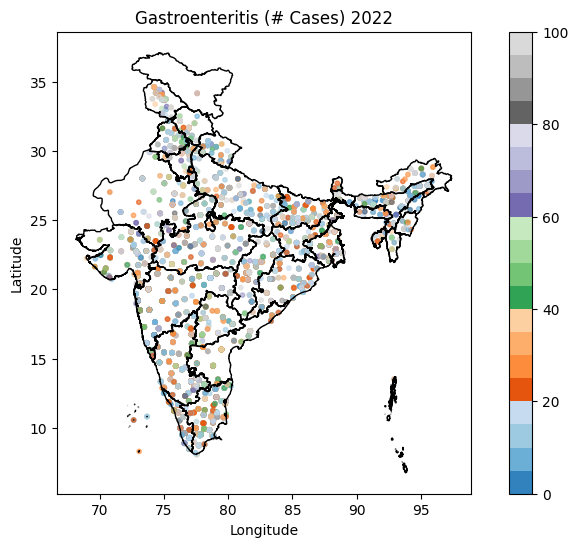

In [111]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Gastroenteritis (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


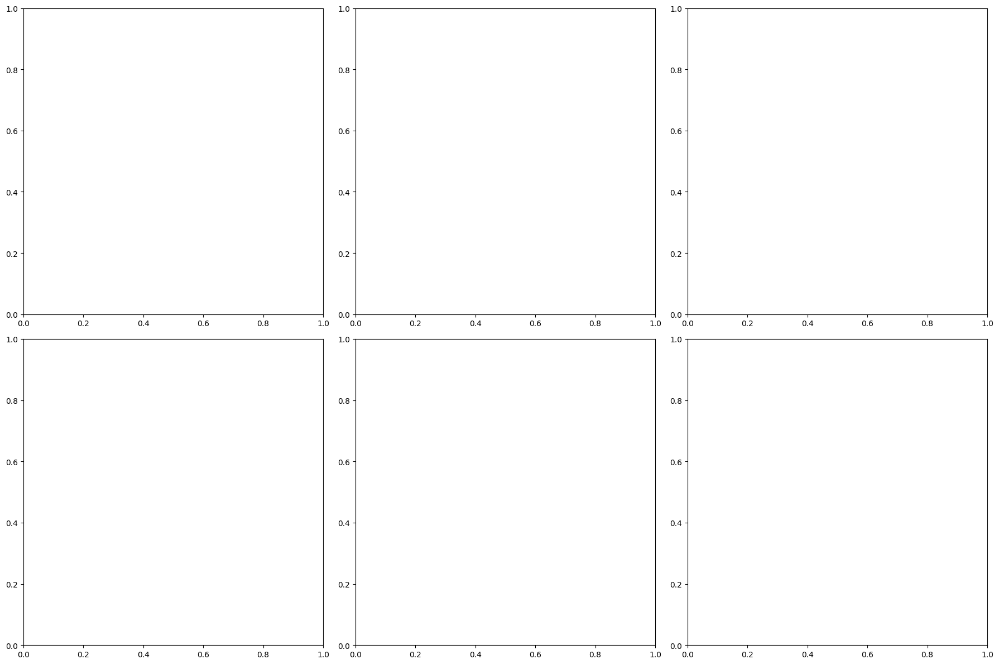

In [112]:
# First, filter the dataset for Gastroenteritis and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_gas = df[(df['Disease'] == "Gastroenteritis") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_gas['Cases'] = pd.to_numeric(df_gas['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_gas[df_gas['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Gastroenteritis ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-113-18b1403b7e57>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


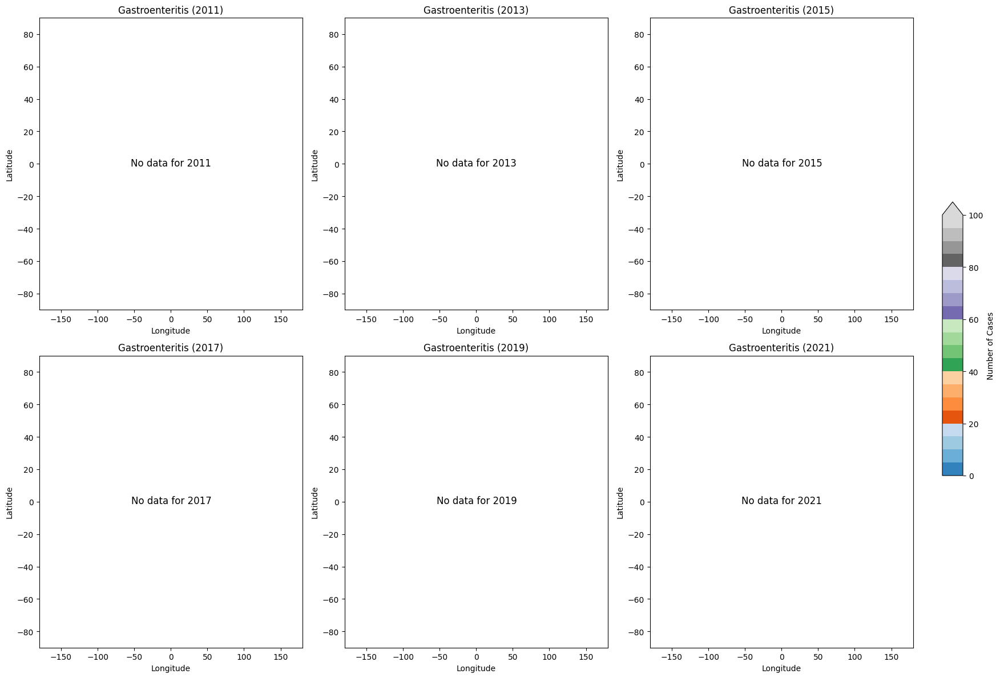

In [113]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_gas[df_gas['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Gastroenteritis  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Gastroenteritis ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue And Malaria

In [114]:
df_dam = df[df.Disease == "Dengue and Malaria"][df.year==2022]
df_dam.head()

<ipython-input-114-fe032177cad0>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_dam = df[df.Disease == "Dengue and Malaria"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


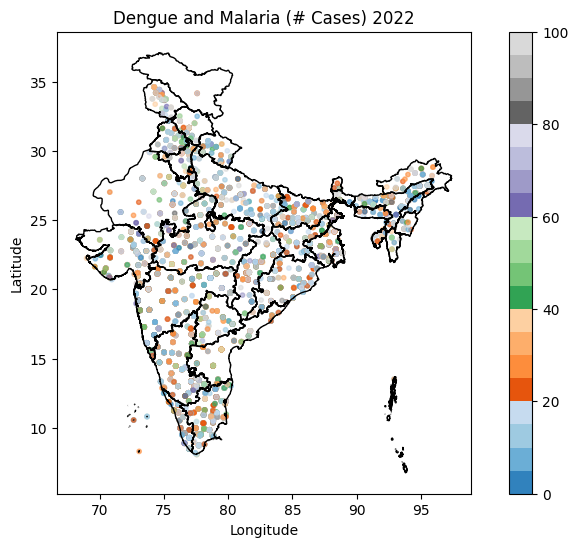

In [115]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue and Malaria (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


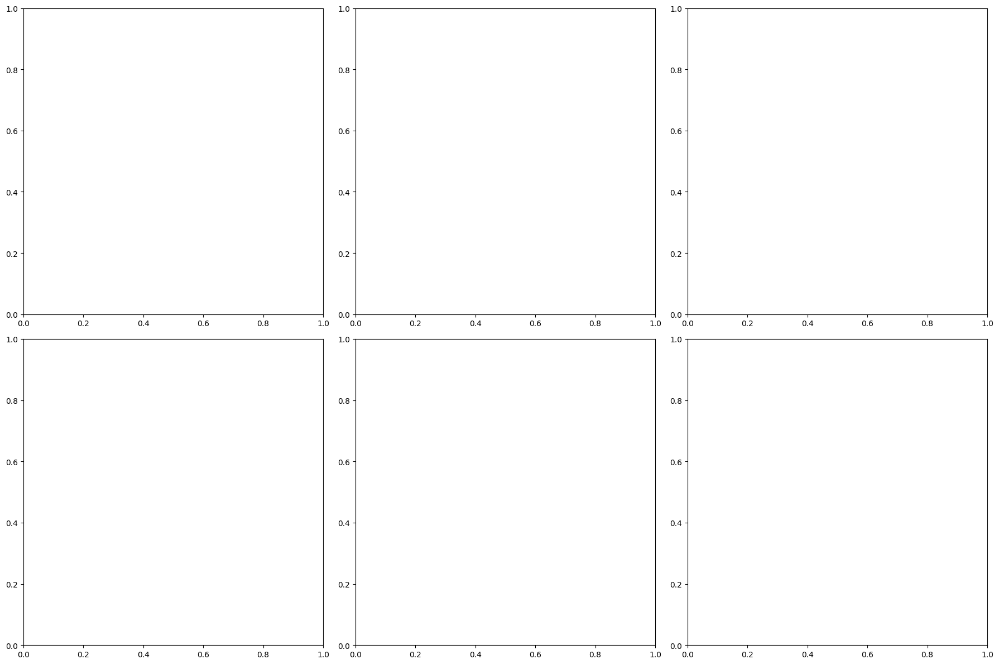

In [116]:
# First, filter the dataset for Dengue and Malaria and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_dam = df[(df['Disease'] == "Dengue and Malaria") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_dam['Cases'] = pd.to_numeric(df_dam['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dam[df_dam['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue and Malaria ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-117-244ce6d1455f>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


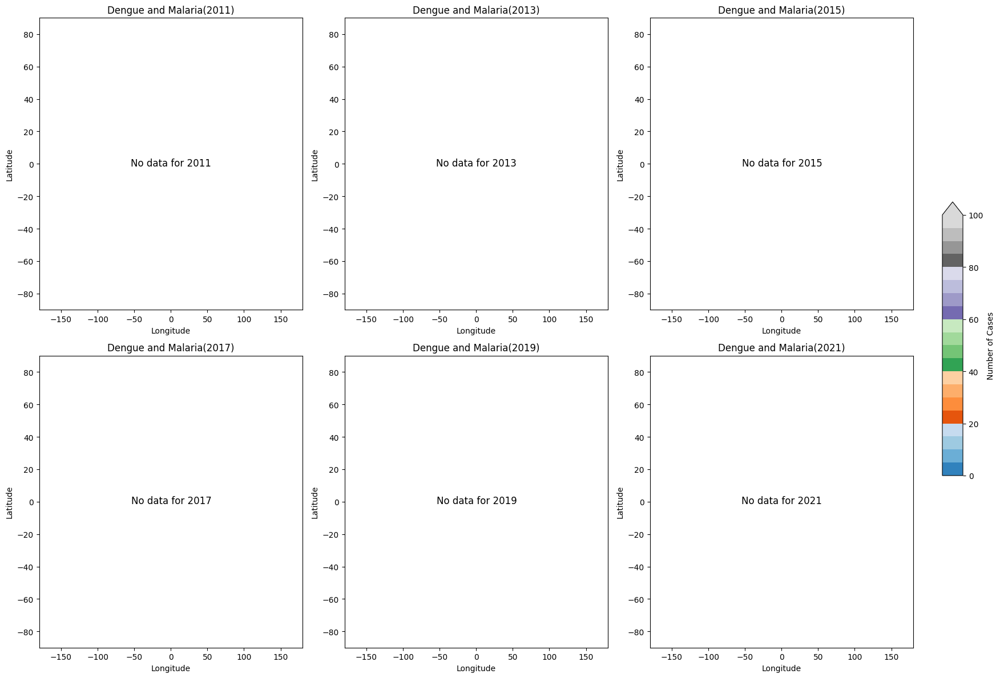

In [117]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dam[df_dam['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue and Malaria  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue and Malaria({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Dengue/Chikungunya

In [118]:
df_dc = df[df.Disease == "Dengue/Chikungunya"][df.year==2022]
df_dc.head()

<ipython-input-118-427ff005d1c7>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_dc = df[df.Disease == "Dengue/Chikungunya"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp


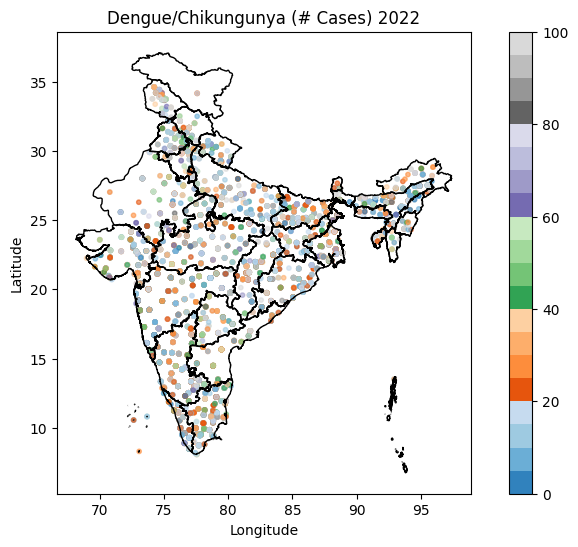

In [119]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Dengue/Chikungunya (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


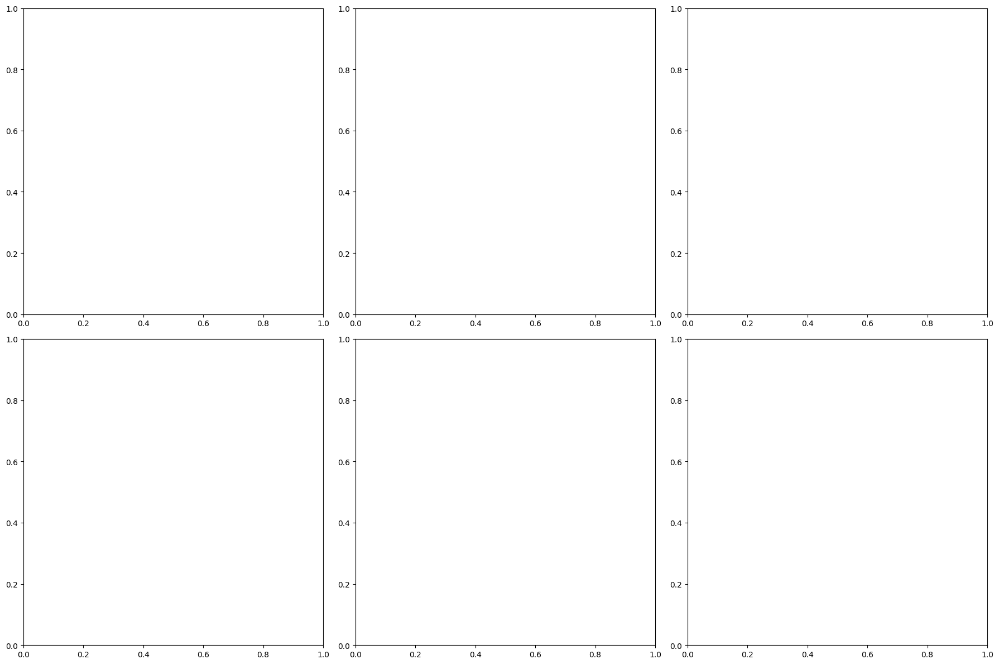

In [120]:
# First, filter the dataset for Dengue/Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_dc = df[(df['Disease'] == "Dengue/Chikungunya") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_dc['Cases'] = pd.to_numeric(df_dc['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dc[df_dc['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue/Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-121-a014a48c9d0c>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


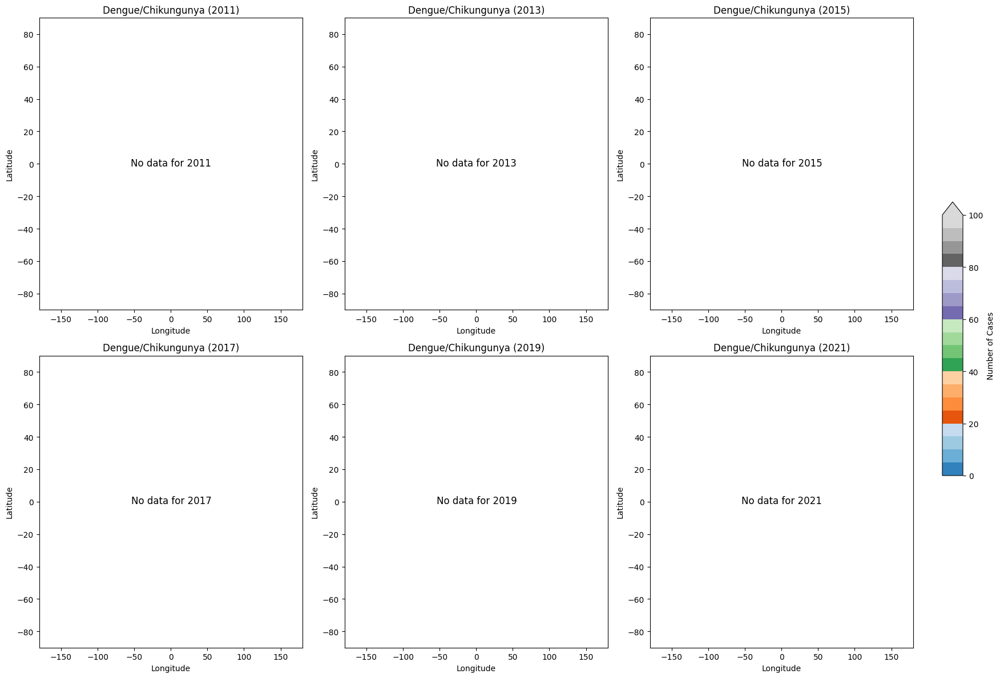

In [121]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_dc[df_dc['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Dengue/Chikungunya  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Dengue/Chikungunya ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()

#Chikungunya/Dengue

In [122]:
df_cd = df[df.Disease == "Chikungunya/Dengue"][df.year==2022]
df_aes.head()

<ipython-input-122-6b9ec15bd77a>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_cd = df[df.Disease == "Chikungunya/Dengue"][df.year==2022]


,Unnamed: 0,week_of_outbreak,state_ut,district,Disease,Cases,Deaths,day,mon,year,Latitude,Longitude,preci,LAI,Temp
317,317,27th week,Assam,Dhemaji,Acute Encephalitis Syndrome,2.0,NaN,9,7,2021,27.466832,94.517865,0.670955,4.0,274.910
343,343,30th week,Assam,Darrang (Mangaldoi),Acute Encephalitis Syndrome,1.0,1.0,15,7,2021,26.436597,92.034272,0.564602,5.0,271.900
344,344,30th week,Assam,Lakhimpur,Acute Encephalitis Syndrome,1.0,1.0,22,7,2021,27.082716,93.997842,0.778388,23.0,300.780
345,345,30th week,Assam,Udalguri,Acute Encephalitis Syndrome,1.0,1.0,25,7,2021,26.772532,92.106417,0.360562,24.0,301.720
369,369,32nd week,Assam,Dima Hasao,Acute Encephalitis Syndrome,1.0,1.0,8,8,2021,25.400363,93.075229,1.280343,33.0,301.515


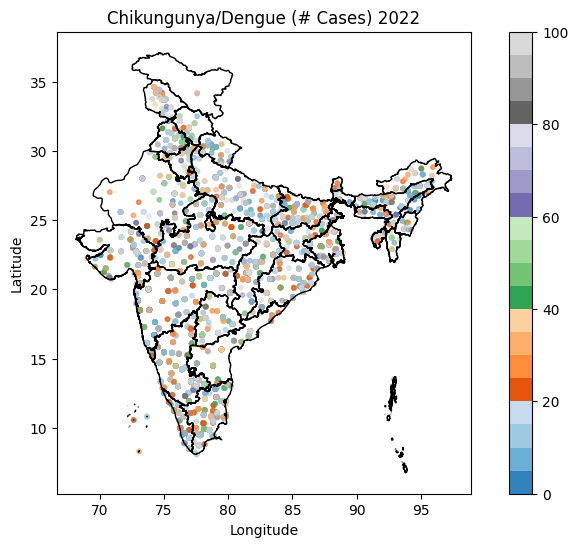

In [123]:
# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df['Cases'] = pd.to_numeric(df['Cases'], errors='coerce').fillna(0)

# Grouping by common day, month, year, latitude, and longitude, and averaging the number of cases
grouped_df = df.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

# Creating a GeoDataFrame for spatial plotting
gdf = gpd.GeoDataFrame(
    grouped_df,
    geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
    crs="EPSG:4326"
)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the points for the cases, colored by the number of cases
gdf_plot  = gdf.plot(column='Cases', ax=ax, legend=True, cmap='tab20c', markersize=10, alpha=0.6, vmax=100)
india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

plt.title('Chikungunya/Dengue (# Cases) 2022')
plt.xlabel('Longitude')
plt.ylabel('Latitude')




# Show the plot
plt.show()

No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.
No data available for {year}, skipping plot.


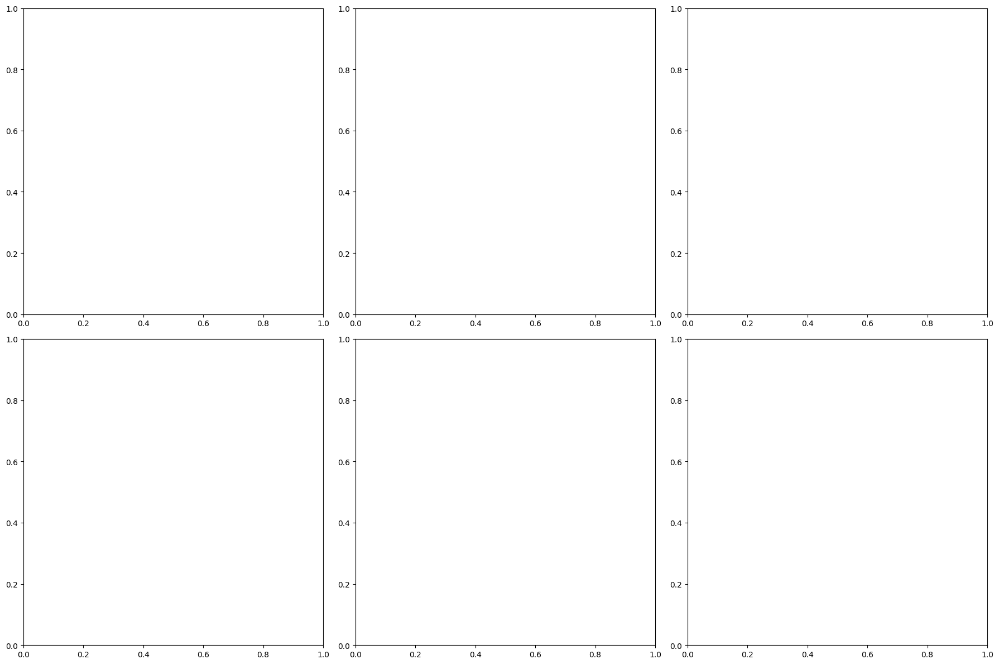

In [124]:
# First, filter the dataset for Dengue/Chikungunya and the specific years
years = [2011, 2013, 2015, 2017, 2019, 2021]
df_cd = df[(df['Disease'] == "Chikungunya/Dengue ") & (df['year'].isin(years))]

# Ensuring 'Cases' column is numeric, forcing any invalid strings to NaN, then filling with zero for aggregation
df_cd['Cases'] = pd.to_numeric(df_cd['Cases'], errors='coerce').fillna(0)

# Create subplots for each year in 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_cd[df_cd['year'] == year]

    # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
    grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

    # Creating a GeoDataFrame for spatial plotting
    gdf = gpd.GeoDataFrame(
        grouped_df,
        geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
        crs="EPSG:4326"
    )


    if not gdf.empty:
        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Chikungunya/Dengue  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        print("No data available for {year}, skipping plot.")
        #ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-125-a569fd1c246c>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


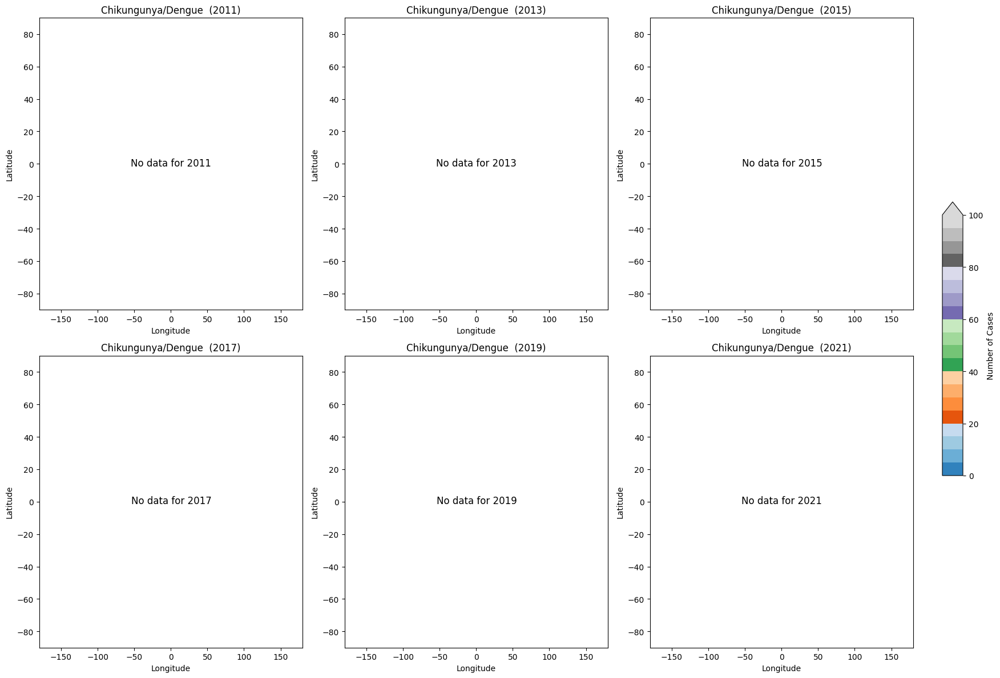

In [125]:
# Replotting with a single shared colorbar for all subplots

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Creating a colorbar axis to share across all subplots
cax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Position for the shared colorbar

# Loop through the years and create a plot for each
for i, year in enumerate(years):
    # Filter data for the specific year
    df_year = df_cd[df_cd['year'] == year]

    if not df_year.empty:  # Proceed only if the data for the year is not empty
        # Group by common day, month, year, latitude, and longitude, and averaging the number of cases
        grouped_df = df_year.groupby(['day', 'mon', 'year', 'Latitude', 'Longitude'], as_index=False).agg({'Cases': 'mean'})

        # Creating a GeoDataFrame for spatial plotting
        gdf = gpd.GeoDataFrame(
            grouped_df,
            geometry=[Point(xy) for xy in zip(grouped_df.Longitude, grouped_df.Latitude)],
            crs="EPSG:4326"
        )

        # Plotting the points for the cases, colored by the number of cases
        ax = axes[i // 3, i % 3]  # Accessing the appropriate subplot
        gdf_plot = gdf.plot(column='Cases', ax=ax, legend=False, cmap='tab20c', markersize=50, alpha=0.6, vmax=100)
        india_states.plot(ax=ax, color='none', edgecolor='black', linewidth=1)  # No fill color, only borders

        # Setting titles and labels for each subplot
        ax.set_title(f'Chikungunya/Dengue ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    else:
        # If there's no data for the year, display an empty plot with a message
        ax = axes[i // 3, i % 3]
        ax.text(0.5, 0.5, f'No data for {year}', horizontalalignment='center', verticalalignment='center', fontsize=12)
        ax.set_xlim([-180, 180])
        ax.set_ylim([-90, 90])
        ax.set_title(f'Chikungunya/Dengue  ({year})')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

# Adding the colorbar to the shared axis
sm = plt.cm.ScalarMappable(cmap='tab20c', norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Cases', extend='max')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Show the plot
plt.show()